### Кластеризация 	
###### Обоснование

  Необходимость кластеризации рядов возникает из-за 2 причин. 
  * Первая причина - это большое количество рядов, для каждого из которых необходимо подбирать прогнозную модель. Мы хотим проверить гипотезу, что можно выделить несколько кластеров, и для каждого кластера применять наиболее подходящую модель. 
  * Второй причиной является наличие временных рядов за слишком малый промежуток времени. Необходимо проверить предположение, что имея ряд за малый промежуток времени, можно найти максимально похожий ряд и строить прогноз, отталкиваясь и от его данных тоже.

###### Способы кластеризации

Кластеризовать ряды можно 2 путями. 

Первый вариант - представлять ряд в виде вектора его различных характеристик (его тренд, сезонности, число значимых лагов в частичной корреляции) и кластеризовать уже новые объекты с меньшим количеством измерений. Этот вариант подходит для решения нашей первой задачи, для выделения групп временных рядов, для которых можно использовать одну модель. 

Второй вариант – сравнивать сами временные ряды, используя специальные метрики. Этот вариант больше подходит для решения второй задачи. 


In [1]:
%run ../libs/libs.py

In [2]:
from scipy.signal import argrelextrema
import prediction as p

###### получим данные

Конфиг

In [3]:
config = "C:/Users/msson/energy_artefacts/conf/gisee_test.json.example"
engine = db.db_connect(config)


The configuration file has been loaded.


In [4]:
mp = {
'6140': '48457',
'8706': '44883',
'9044': '43824',
'9292': '43831',
'11470': '43827',
'11493': '43832',
'13287': '43821',
'13406':'43828',
'13447':'43826',
'13732':'43823',
'18217':'48378',
'24764':'45138',
'26065':'48363',
'28288':'48354',
'37510':'48470',
#'37598':'48470',
'37919':'61543',
'38486':'48472',
'38497':'48473'}
#'54108':'48932',
#'54116':'48932',
    

PREPARING DATA
first date for which data are available:           2018-06-07T00:00:00.000000000
total number of days for which there is data:      907
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.052021


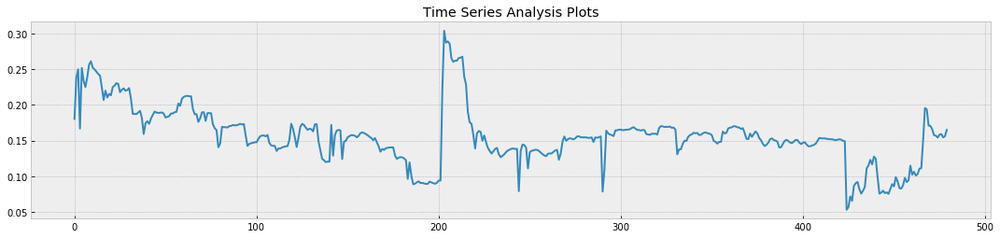

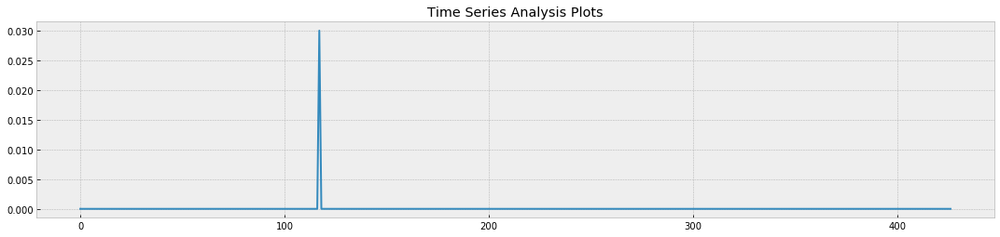

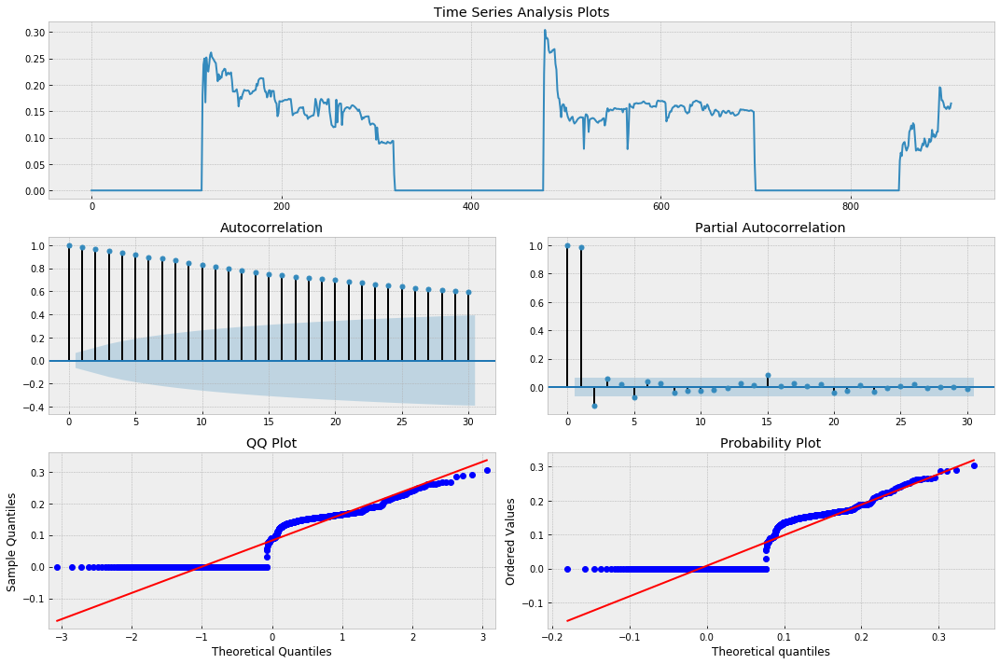

PREPARING DATA
first date for which data are available:           2018-08-20T00:00:00.000000000
total number of days for which there is data:      464
The last date on which the training is conducted:  2019-05-11T00:00:00.000000000
Критерий Дики-Фуллера: p=0.431625


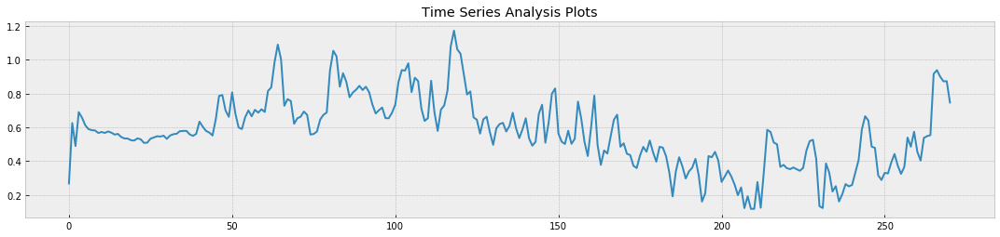

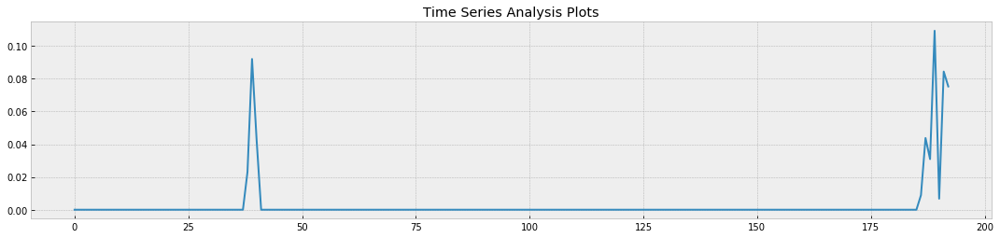

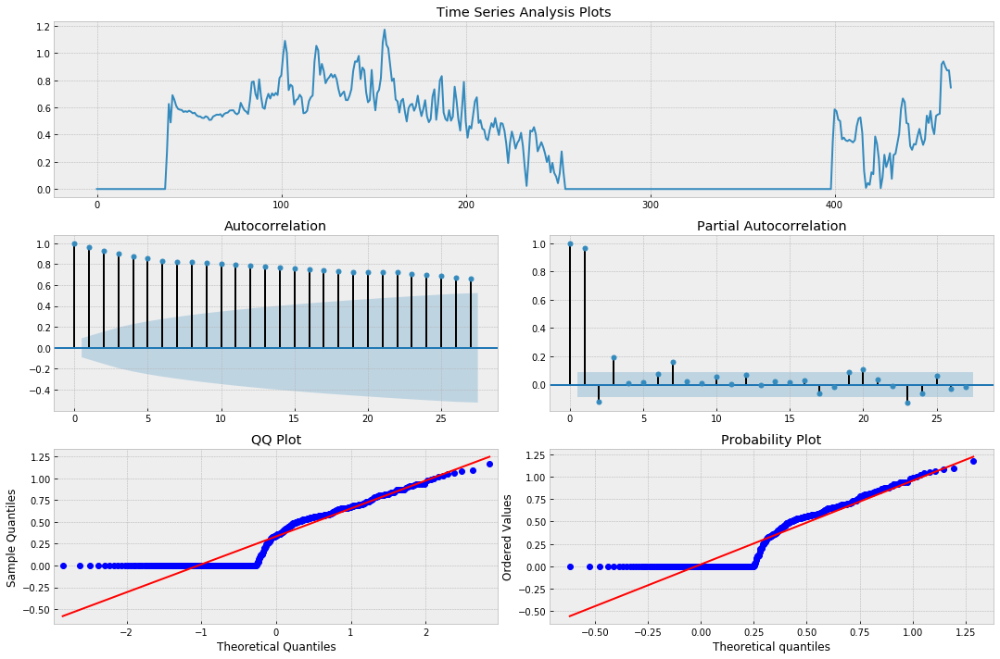

PREPARING DATA
first date for which data are available:           2018-10-19T00:00:00.000000000
total number of days for which there is data:      773
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.184644


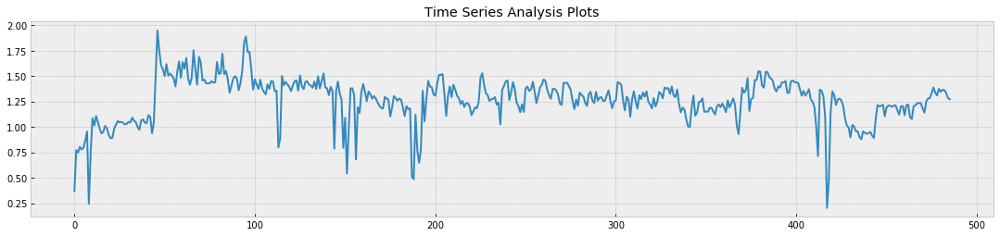

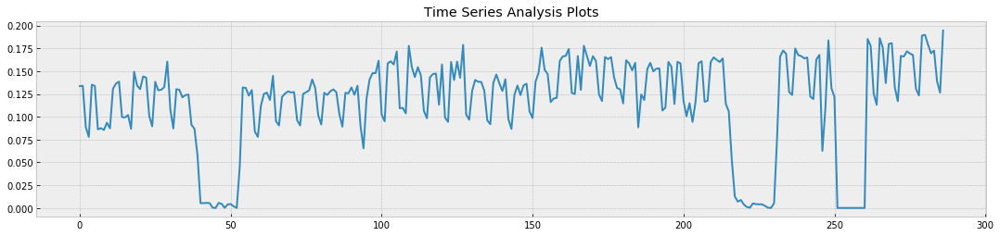

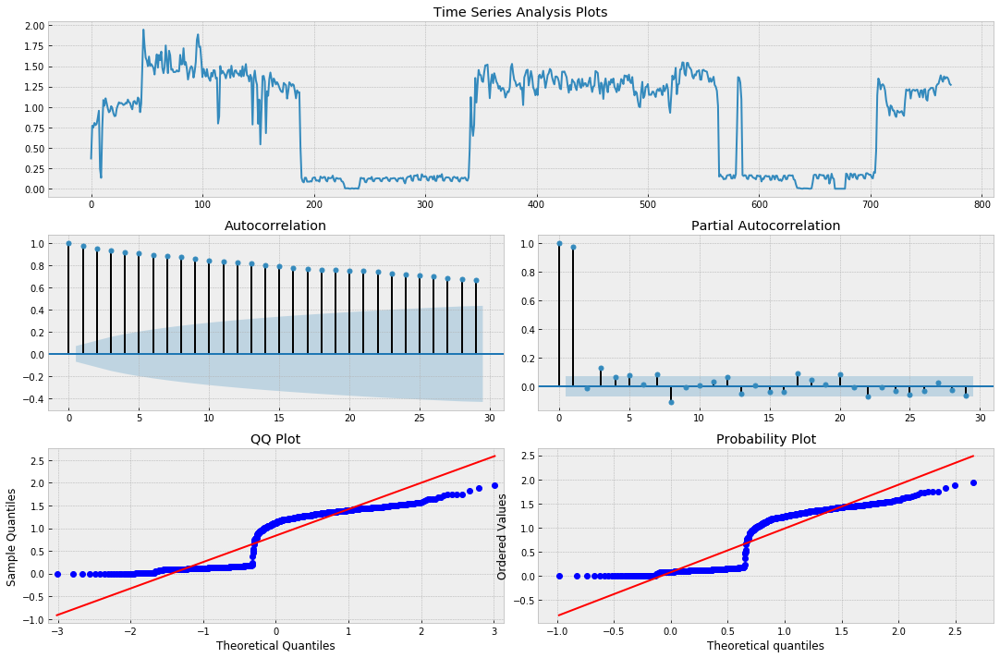

PREPARING DATA
first date for which data are available:           2018-10-03T00:00:00.000000000
total number of days for which there is data:      789
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.360418


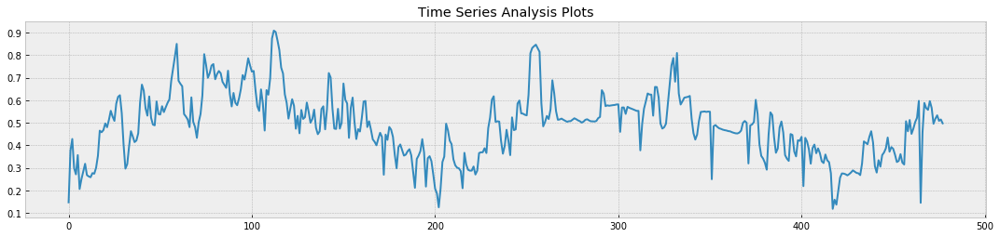

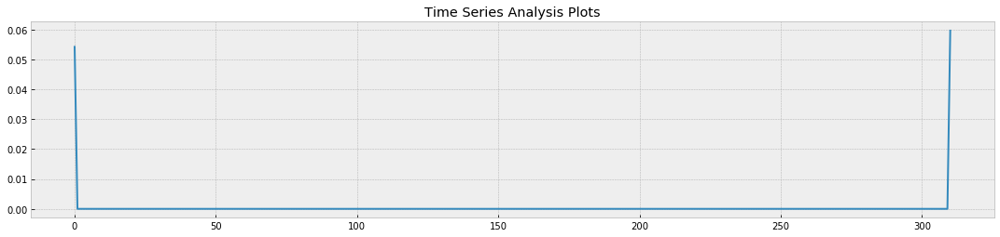

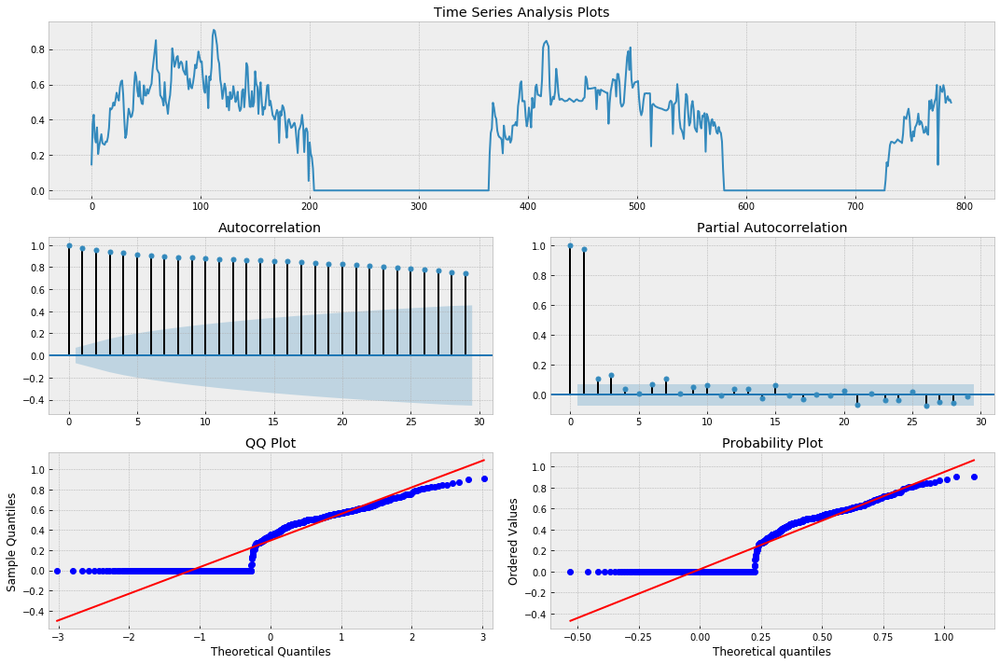

PREPARING DATA
first date for which data are available:           2018-10-02T00:00:00.000000000
total number of days for which there is data:      790
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.043894


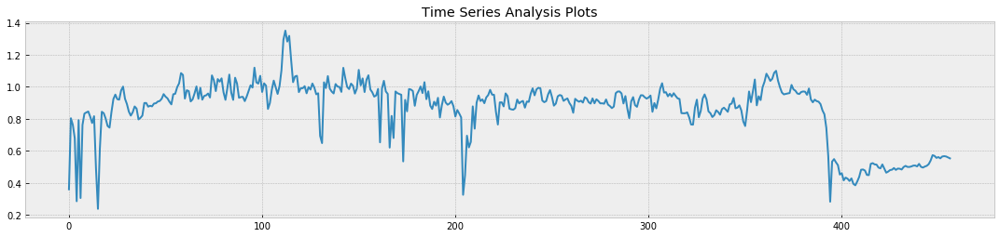

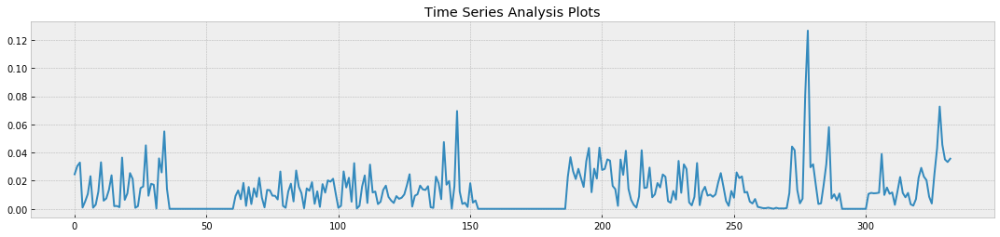

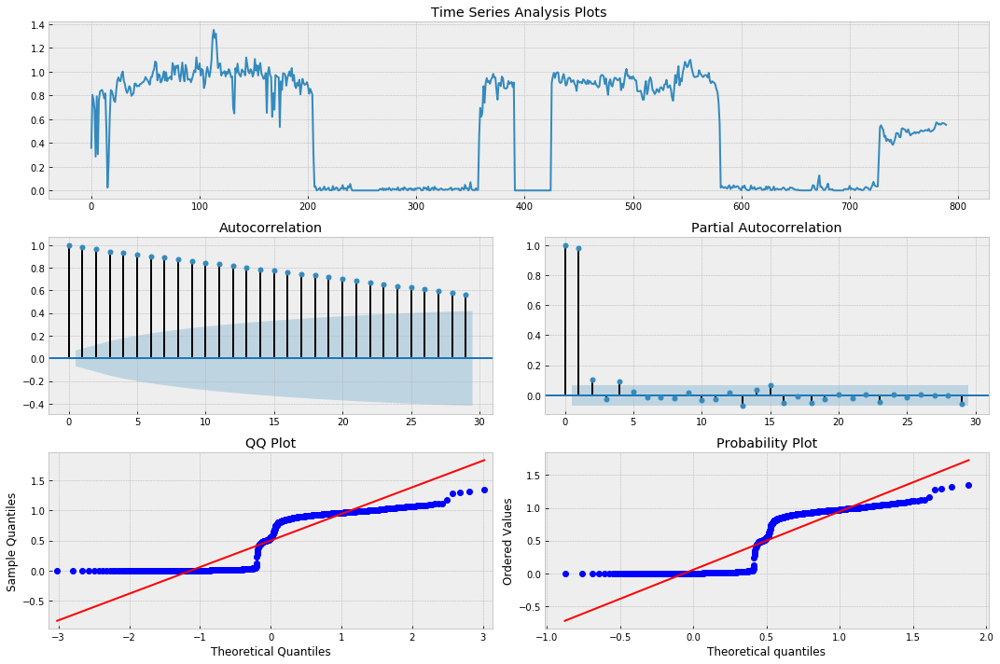

PREPARING DATA
first date for which data are available:           2018-10-02T00:00:00.000000000
total number of days for which there is data:      790
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.043894


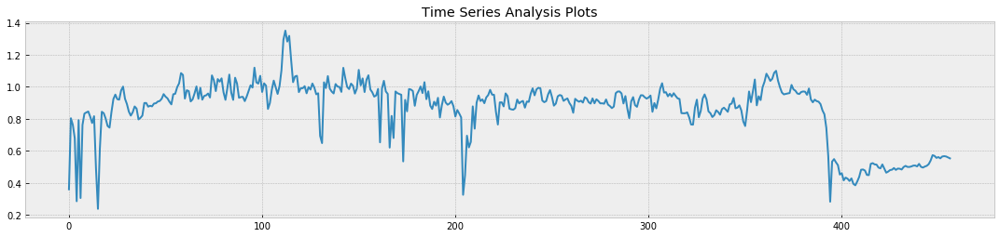

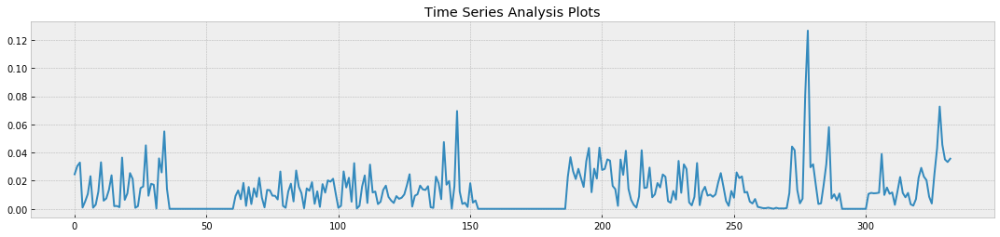

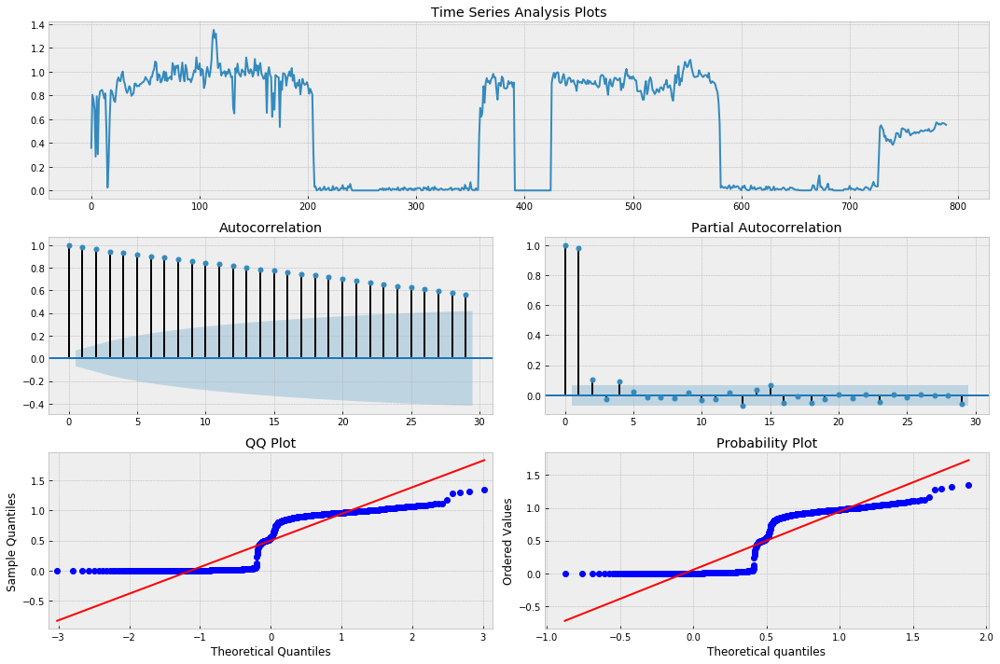

PREPARING DATA
first date for which data are available:           2018-10-17T00:00:00.000000000
total number of days for which there is data:      775
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.098482


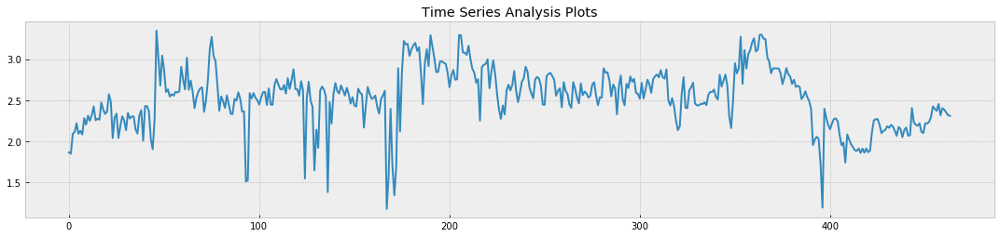

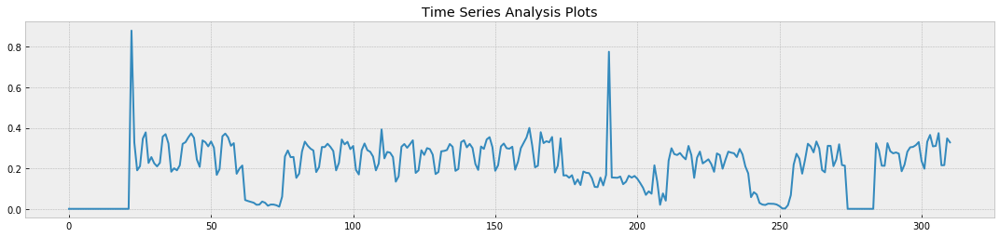

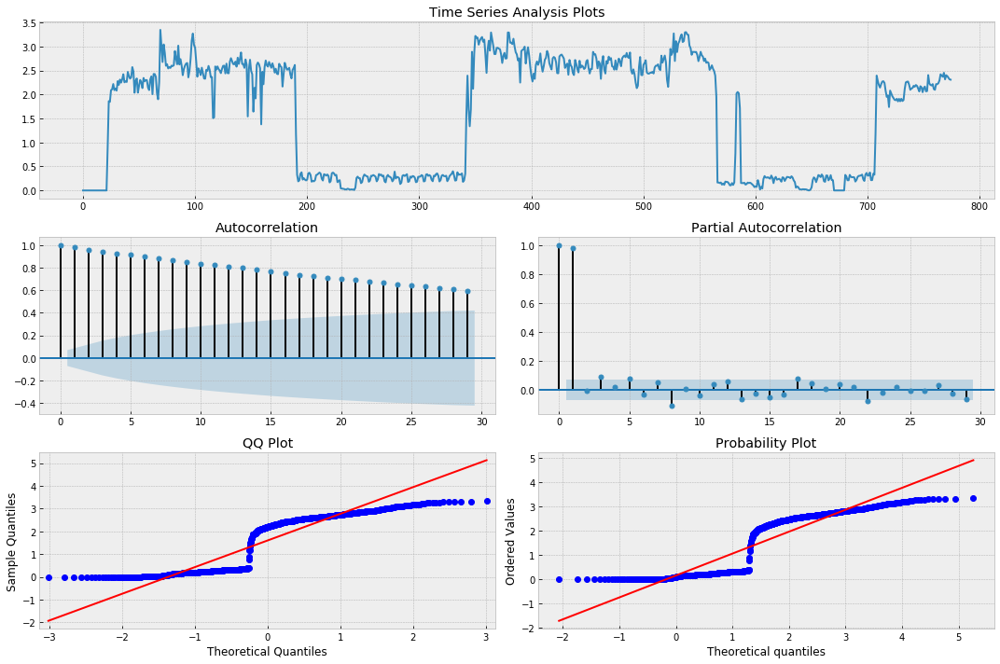

PREPARING DATA
first date for which data are available:           2018-10-04T00:00:00.000000000
total number of days for which there is data:      788
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.299866


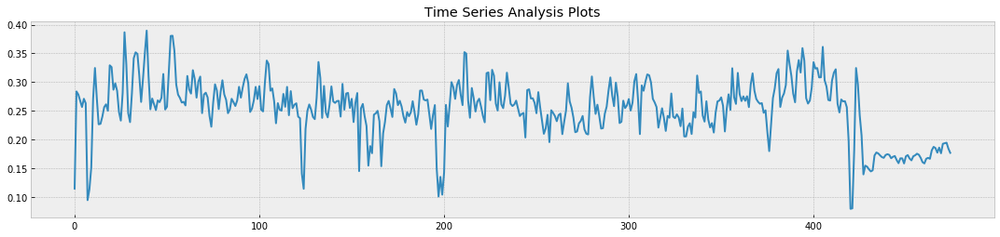

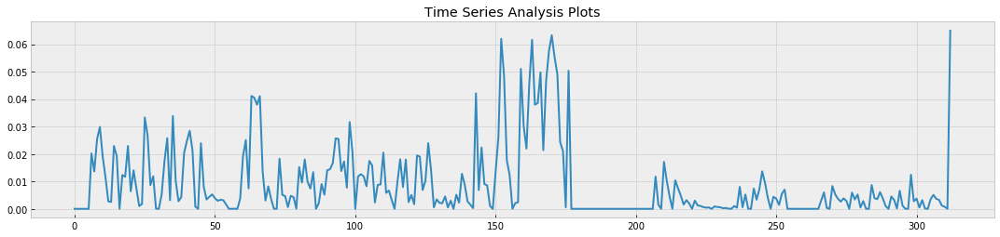

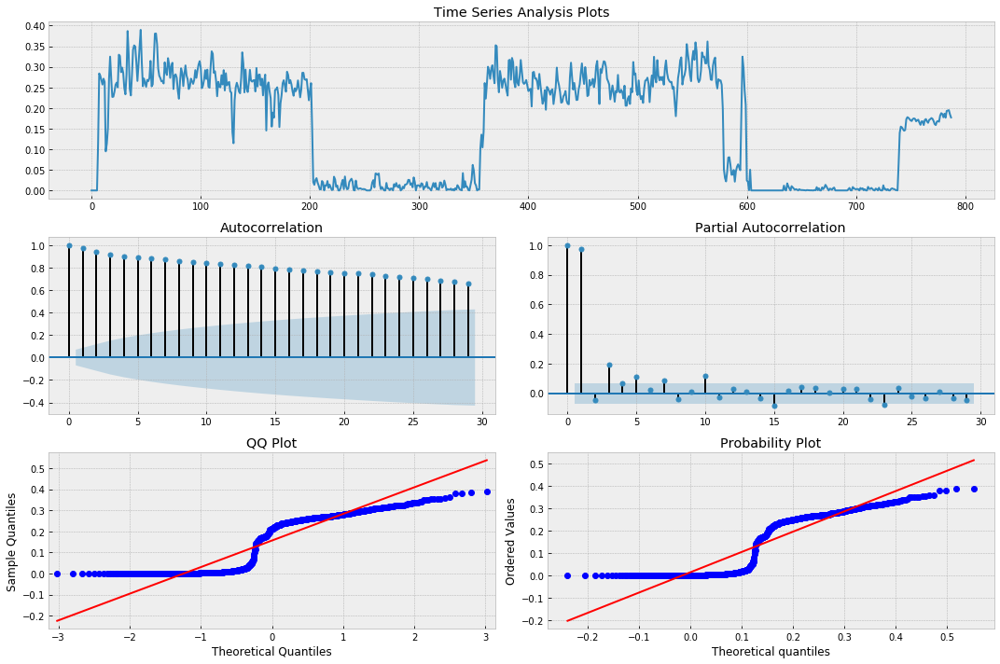

PREPARING DATA
first date for which data are available:           2018-10-04T00:00:00.000000000
total number of days for which there is data:      625
The last date on which the training is conducted:  2019-12-03T00:00:00.000000000
Критерий Дики-Фуллера: p=0.415823


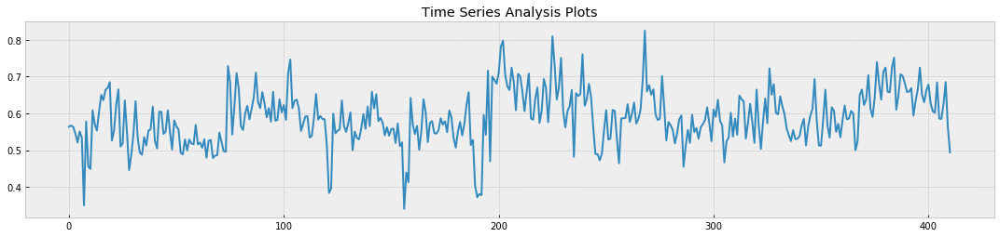

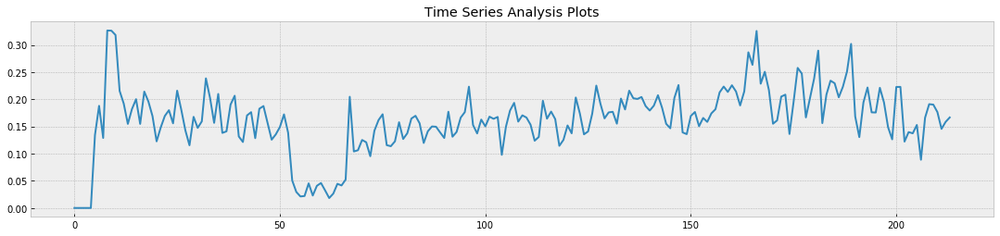

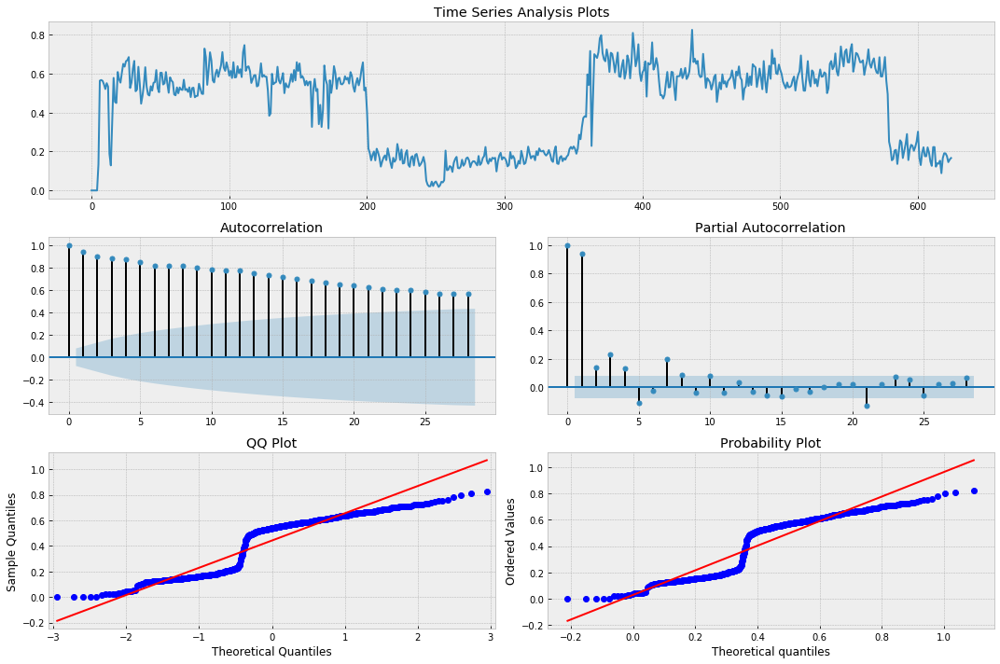

PREPARING DATA
first date for which data are available:           2018-10-17T00:00:00.000000000
total number of days for which there is data:      775
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.100554


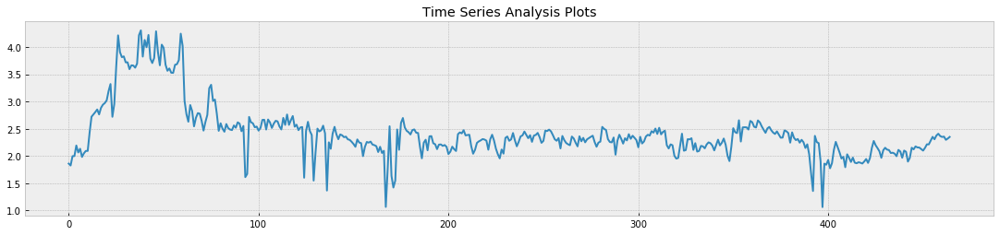

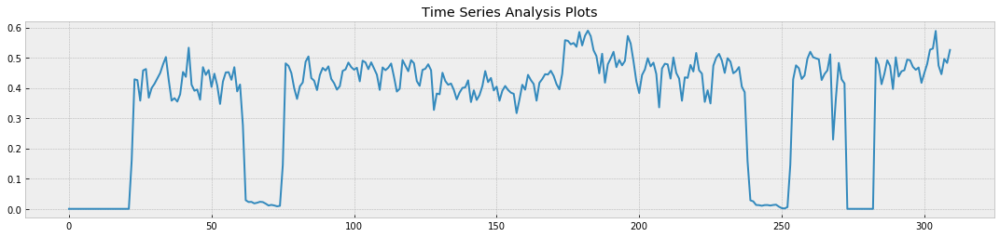

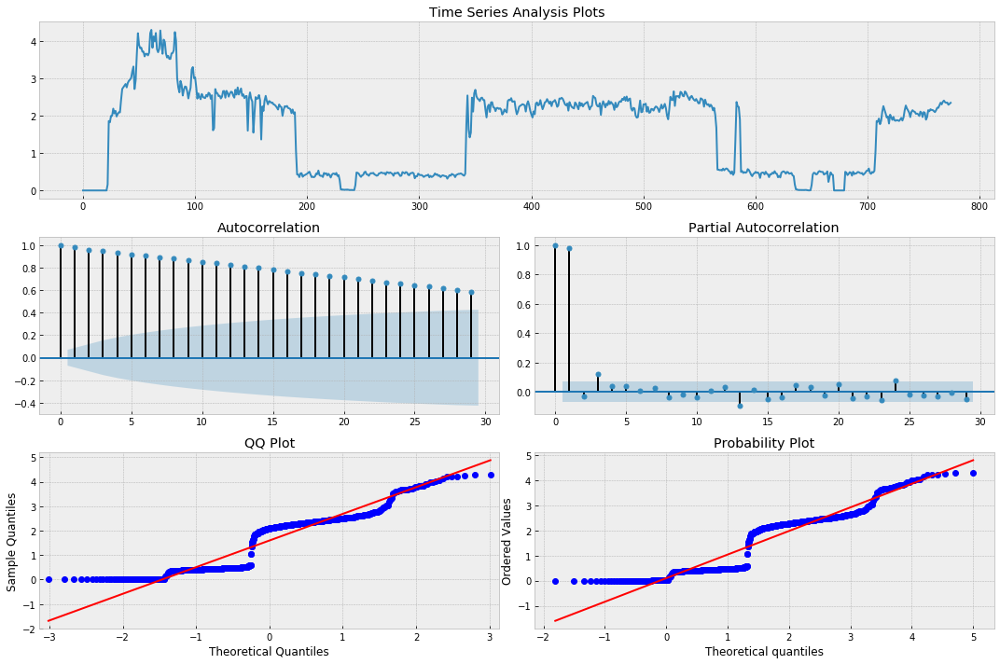

PREPARING DATA
first date for which data are available:           2018-09-04T00:00:00.000000000
total number of days for which there is data:      818
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.169134


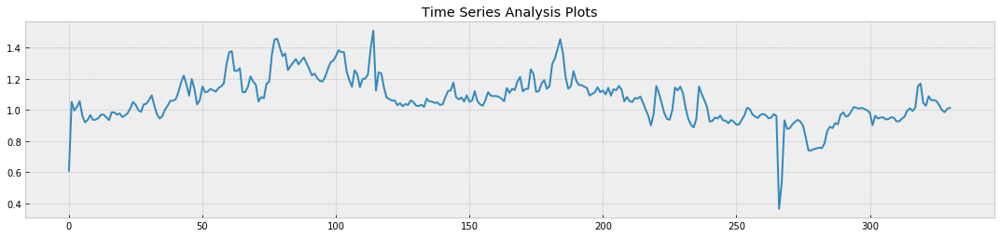

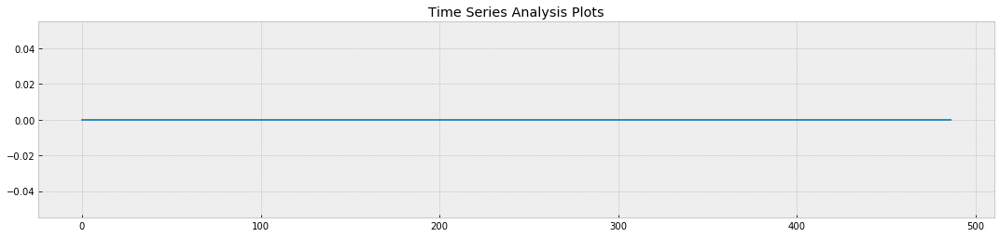

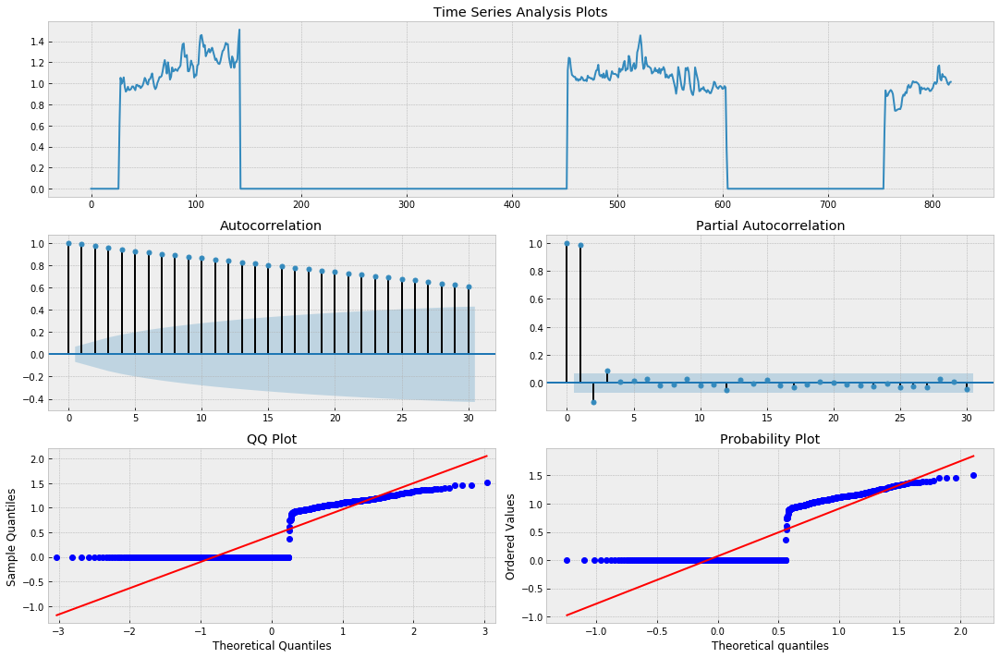

PREPARING DATA
first date for which data are available:           2018-10-30T00:00:00.000000000
total number of days for which there is data:      762
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.530356


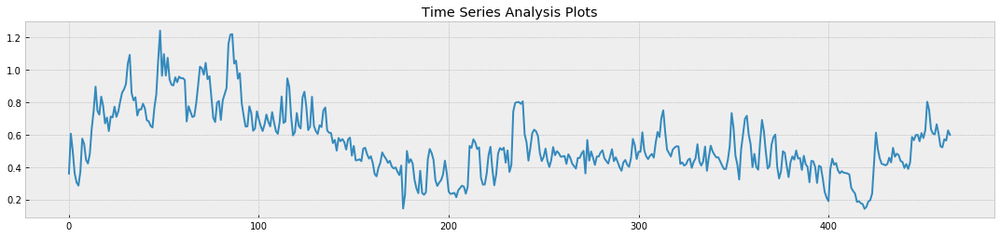

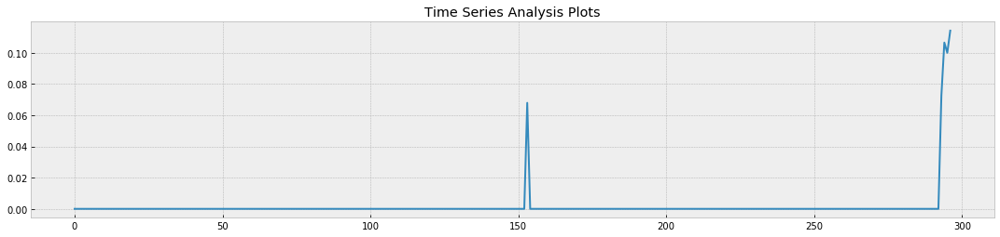

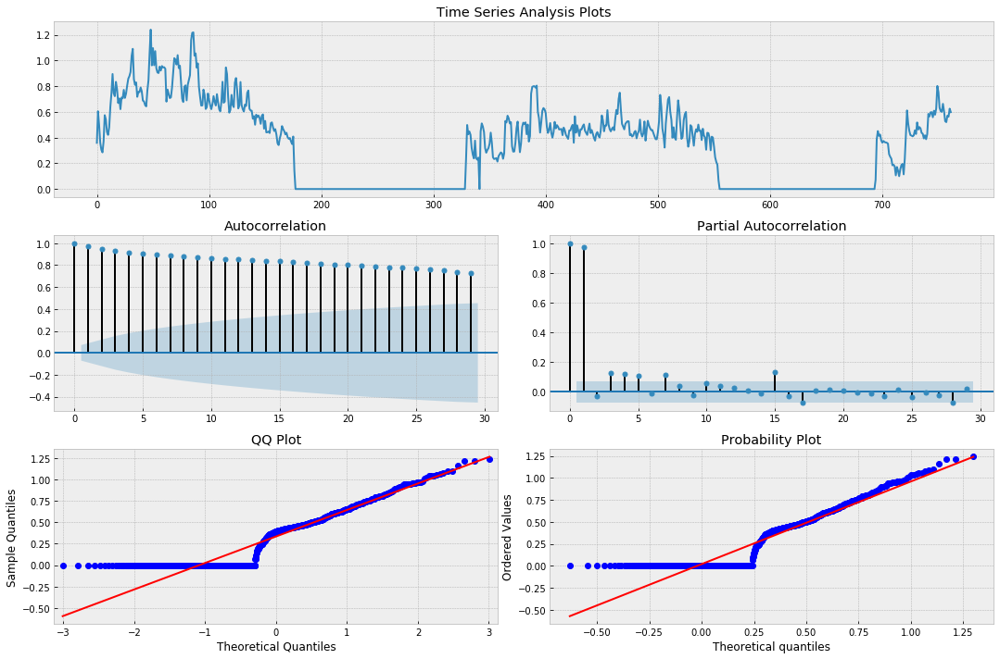

PREPARING DATA
first date for which data are available:           2018-09-03T00:00:00.000000000
total number of days for which there is data:      819
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.266538


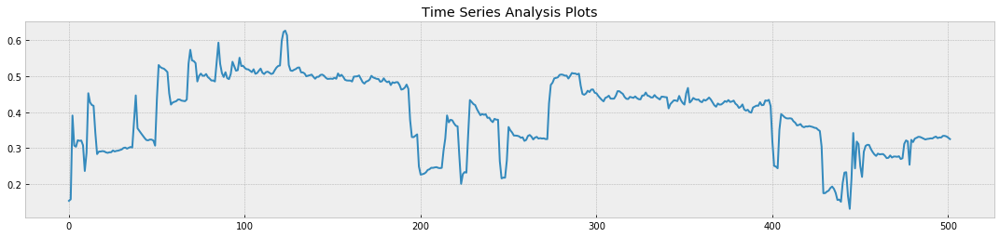

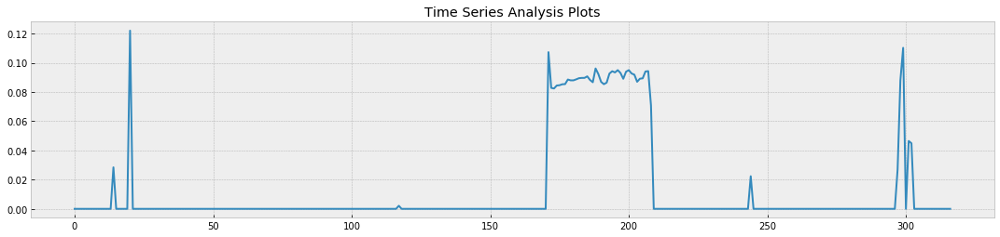

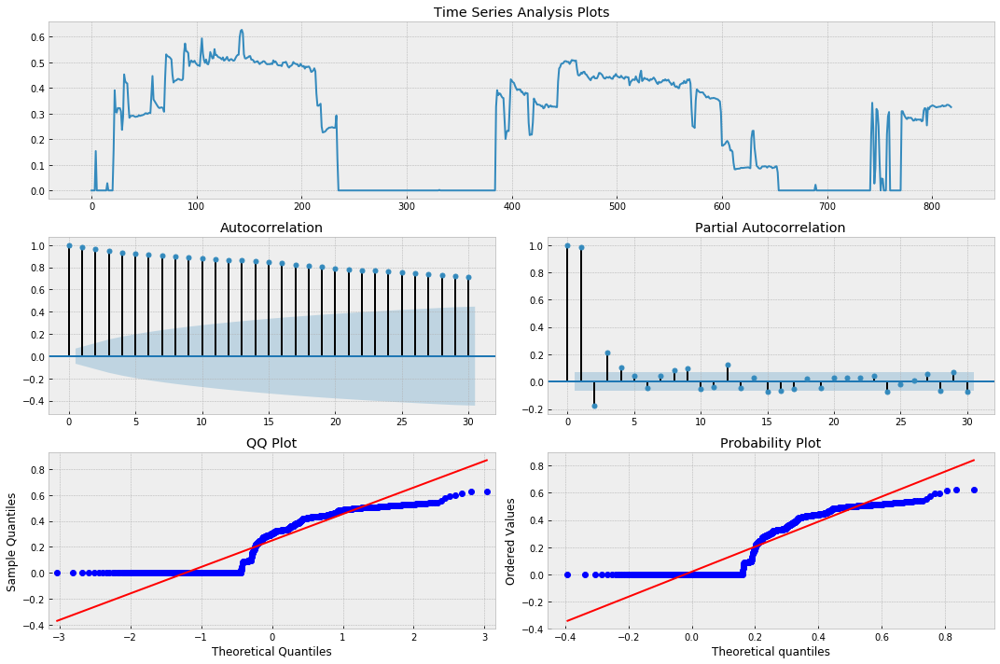

PREPARING DATA
first date for which data are available:           2018-09-03T00:00:00.000000000
total number of days for which there is data:      819
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.372842


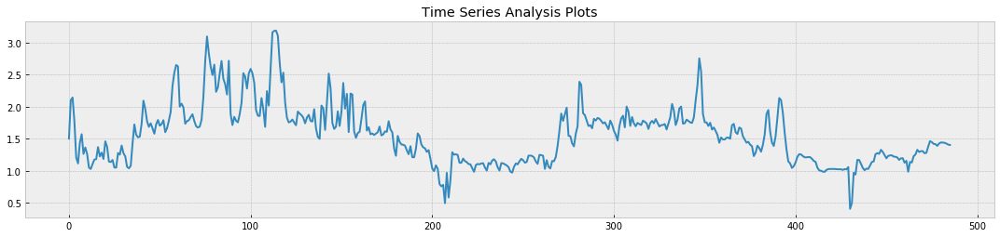

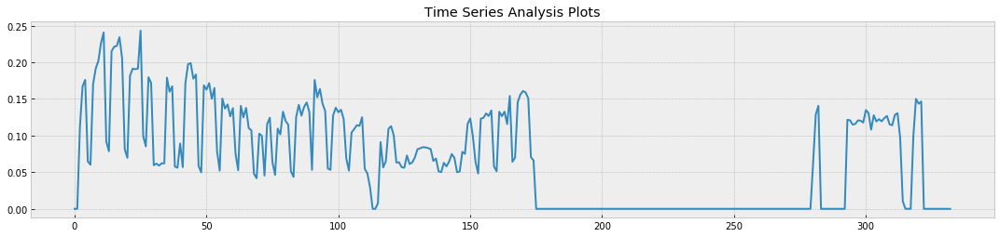

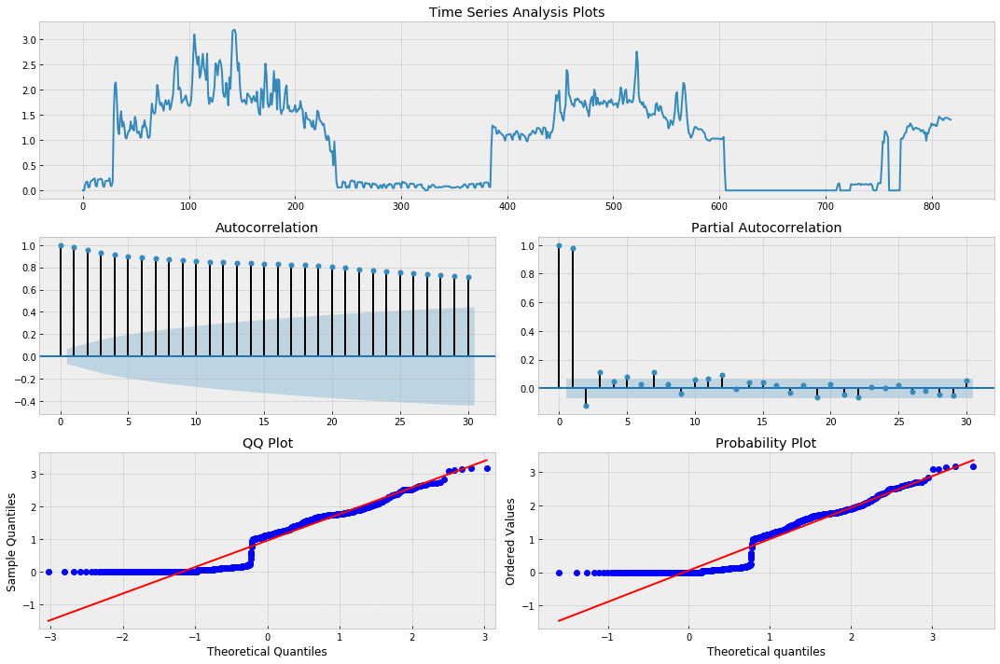

PREPARING DATA
first date for which data are available:           2018-11-28T00:00:00.000000000
total number of days for which there is data:      733
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.382866


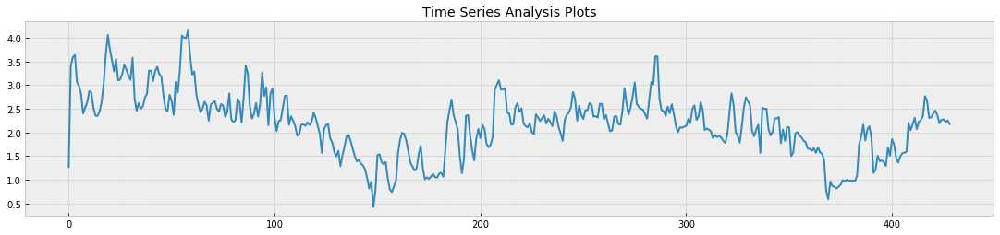

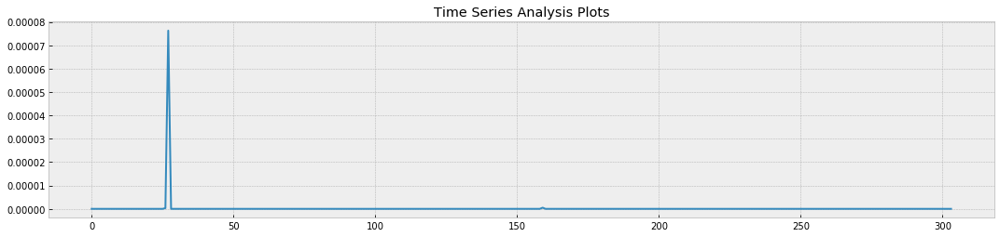

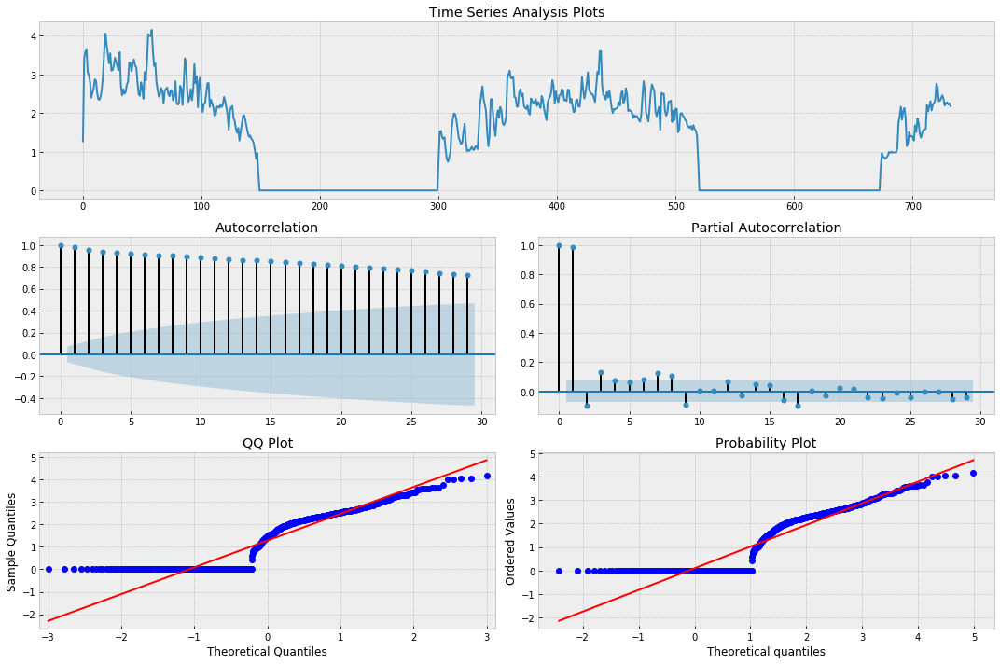

PREPARING DATA
too little data to analyze
PREPARING DATA
first date for which data are available:           2018-11-29T00:00:00.000000000
total number of days for which there is data:      732
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.455560


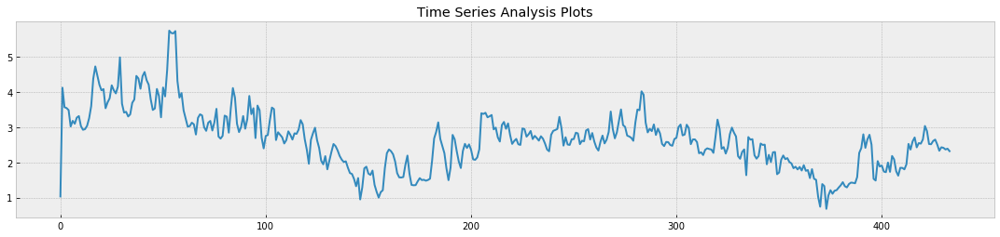

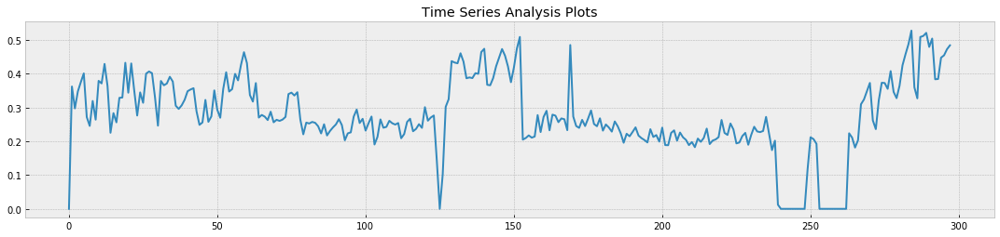

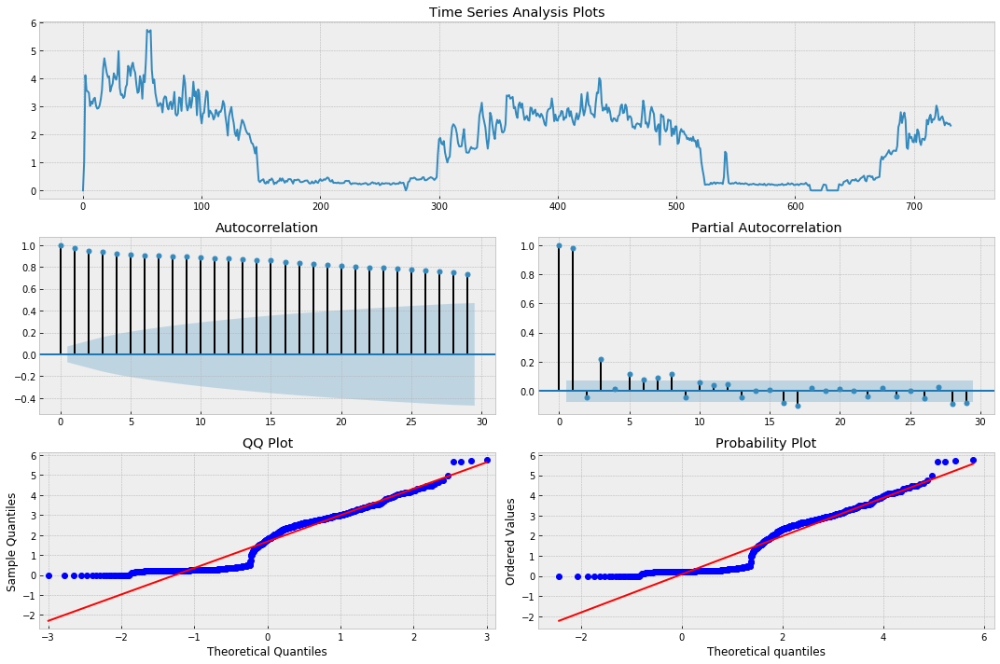

PREPARING DATA
first date for which data are available:           2018-11-30T00:00:00.000000000
total number of days for which there is data:      731
The last date on which the training is conducted:  2020-05-14T00:00:00.000000000
Критерий Дики-Фуллера: p=0.373801


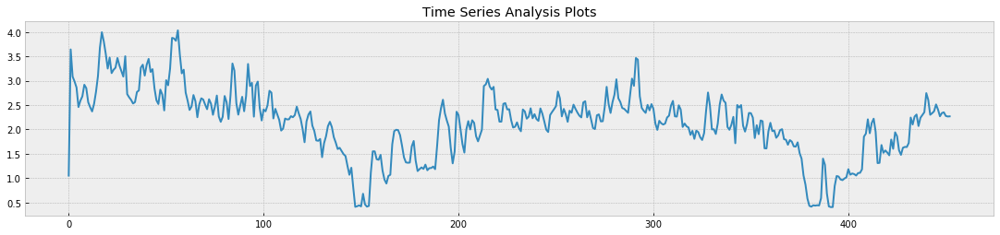

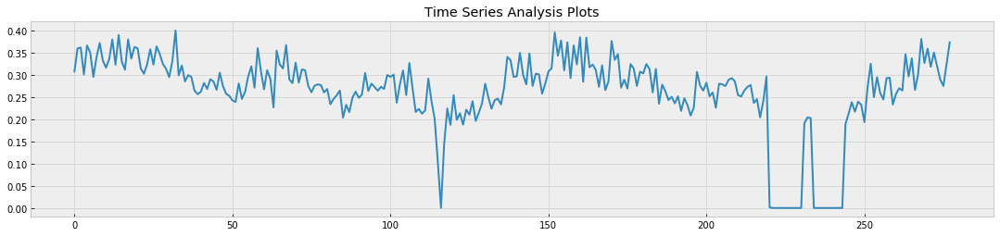

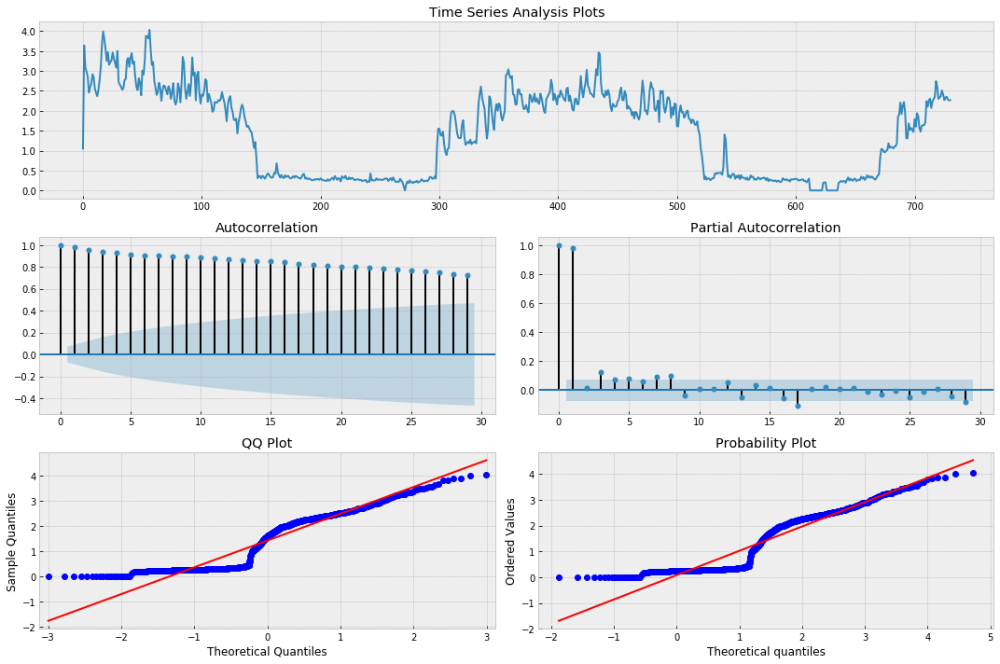

In [5]:
timeseries = []
for i in mp:
    df = db.get_informaion_from_first_forecast_qisee(engine, 10, i, mp[i])
    try:
        df, res = p.preparing_data(df)
        winter_df, summer_df = distributions_division(df.ec_d)

        tsplot(np.array(df.ec_d))
        plt.show()
        timeseries.append(df)
    except:
        continue

In [150]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 0;

<IPython.core.display.Javascript object>

Для начала убираем аномальные значения из данных.

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\axes\_base.py:278: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated

C:\Users\msson\diploma\Automated-Pipeline-for-Predicting-Readings-for-Objects-with-Different-Characteristics\libs\libs.py:78: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\diploma\Automated-Pipeline-for-Predicting-Readings-for-Objects-with-Different-Characteristics\libs\libs.py:78: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\adtk\visualization\_visualization.py:248: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matp

C:\Users\msson\diploma\Automated-Pipeline-for-Predicting-Readings-for-Objects-with-Different-Characteristics\libs\libs.py:78: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\adtk\visualization\_visualization.py:248: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert 

C:\Users\msson\diploma\Automated-Pipeline-for-Predicting-Readings-for-Objects-with-Different-Characteristics\libs\libs.py:78: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\adtk\visualization\_visualization.py:248: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert 

C:\Users\msson\diploma\Automated-Pipeline-for-Predicting-Readings-for-Objects-with-Different-Characteristics\libs\libs.py:78: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\adtk\visualization\_visualization.py:248: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert 

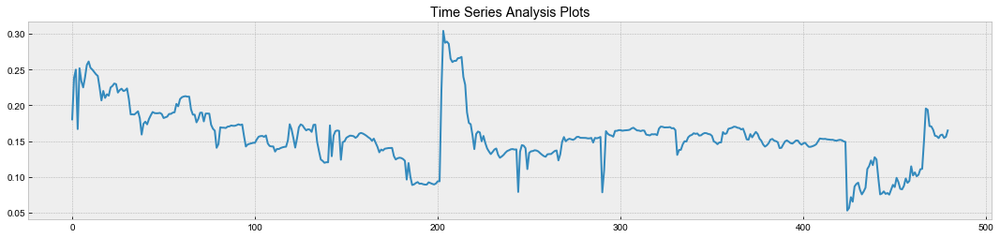

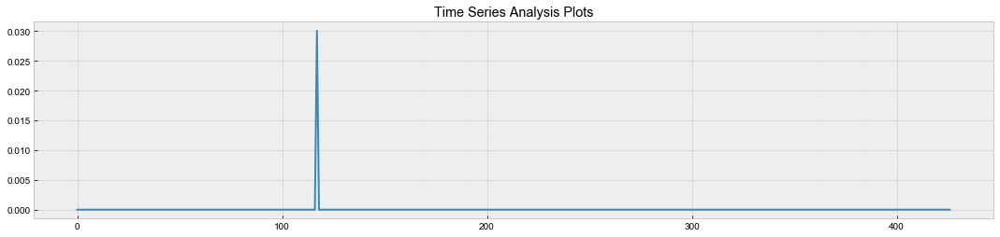

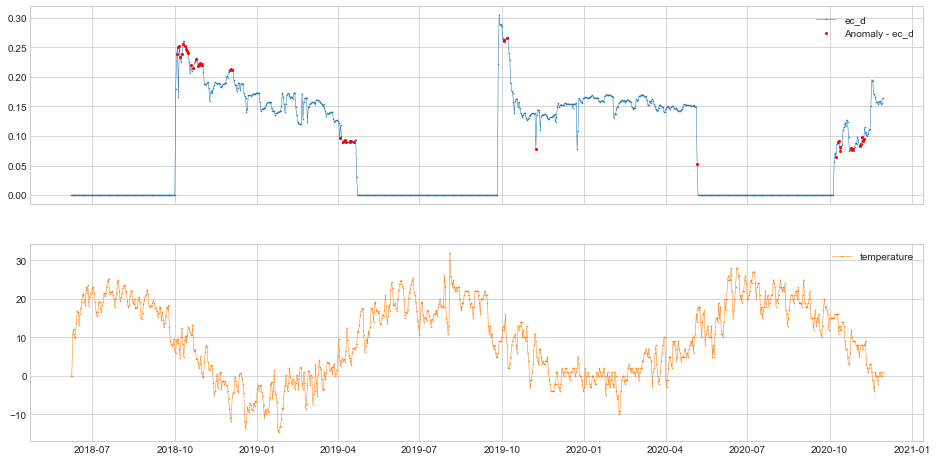

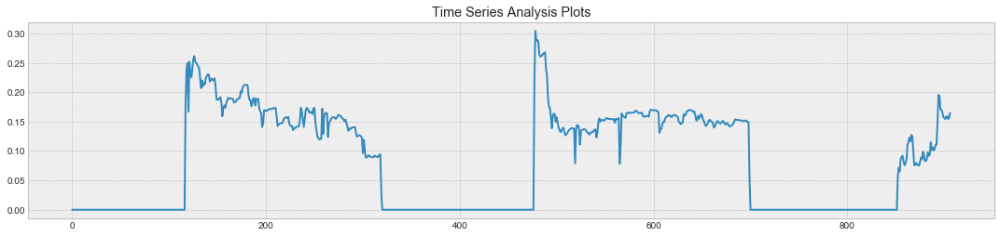

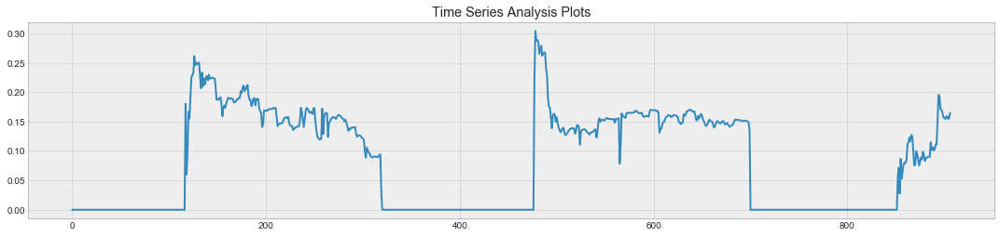

...

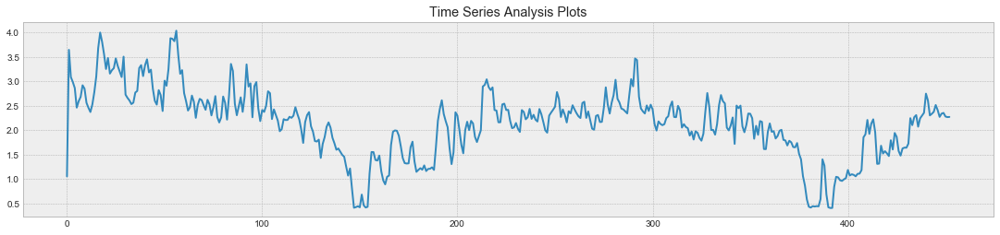

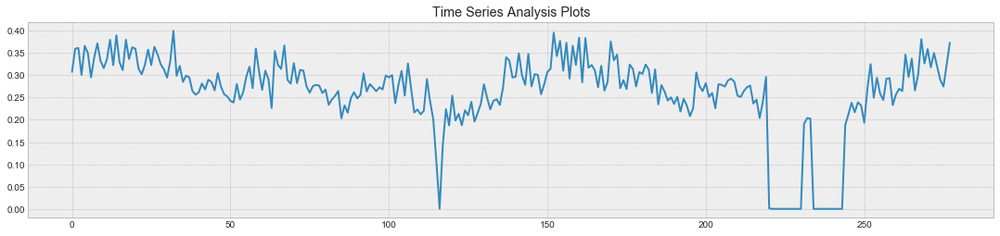

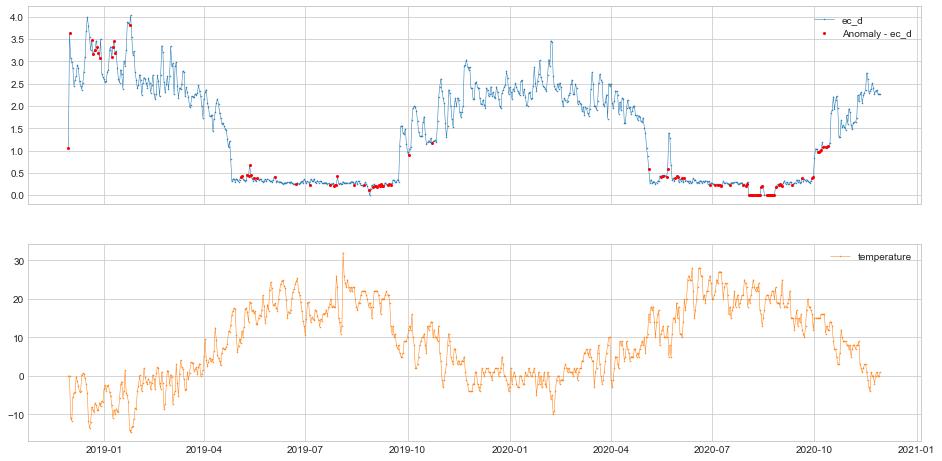

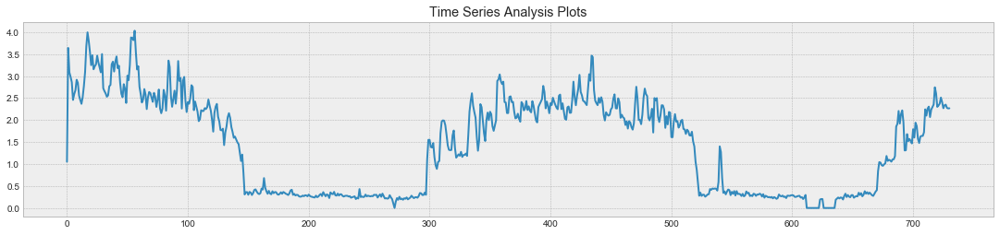

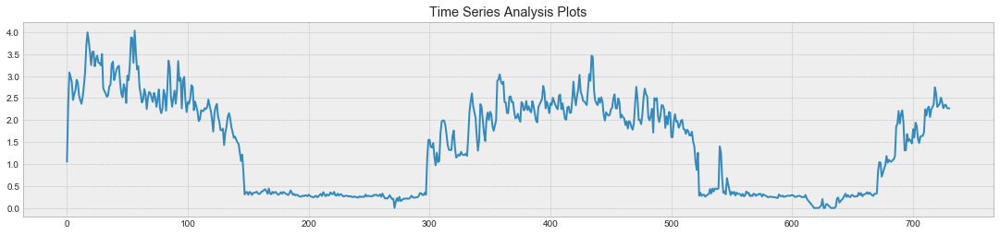

In [6]:
for i in range(len(timeseries)):
    timeseries[i] = delete_anomalies_all(timeseries[i], engine)

#### Кластеризация по основным статистическим показателям

Показатели:
* сезонность (летняя / зимняя)
* тренд (летний / зимний)
* среднее летнее потребление (Этот показатель добавлен, так как наблюдение показало, что есть здания, у которых летнее потребление равно нулю. Для таких зданий летний прогноз будет константным)
* число частичных корреляций 
* корреляция с температурным временным рядом

Визуально, в рядах (потребление тепловой энергии, потребление горячей/холодной воды) сильно выделяется годовая сезонность. Летнее и зимнее потребление ресурсов есть смысл предсказывать отдельно, с помощью разных моделей. 
Поэтому, мы кластеризуем ряды отдельно для летнего и отдельно для зимнего потребления.


###### Способы определения смены сезона отопления. 

Вариант 1

Для разделения ряда на летний и зимний отопительные периоды необходимо было определить значение для ряда, выше которого начинается зимнее потребление, а ниже – летнее. Для определения этого значения использовалась следующая схема. Строится гистограмма распределения с 10 численными интервалами (Строится не непрерывное распределение для того, чтобы сгладить функцию и привести ее в нужный вид). Видно, что самые частотные значения будут попадать примерно в начало и конец гистограммы (так как летнее потребление принимает минимальные значения, а зимние – максимальные, а переходный период – средние значения - самый краткосрочный), а сама гистограмма принимает вид “седла”. По этому графику несложно определить минимальное значение седловой функции, которое и будет точкой смены отопительного сезона.

In [7]:
def distributions_division(data):
    # для разделения вероятностей строим распределение и находим значение, которое вроятнее всего разделяет распределения
    # для этого находим 2 самых популярных бина и между ними самый непопулярный
    nbins = 10
    n, bins = np.histogram(data, nbins, density=1)
    argmax1 = n[:int(nbins/2)].argmax()
    argmax2 = n[int(nbins/2):].argmax() + int(nbins/2)
    argmin1 = n[argmax1:argmax2].argmin() + argmax1
    min1 = bins[argmin1]
    
    tsplot_only(np.array(data.loc[data > min1])) 
    tsplot_only(np.array(data.loc[data < min1])) 
    return data.loc[data > min1], data.loc[data < min1]

Вариант 2

Искать сдвиг уровня значения, отслеживая разницу между медианными значениями в двух скользящих временных окнах рядом друг с другом. 

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\axes\_base.py:278: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Users\msson\Anaconda3\envs\stan_env\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated

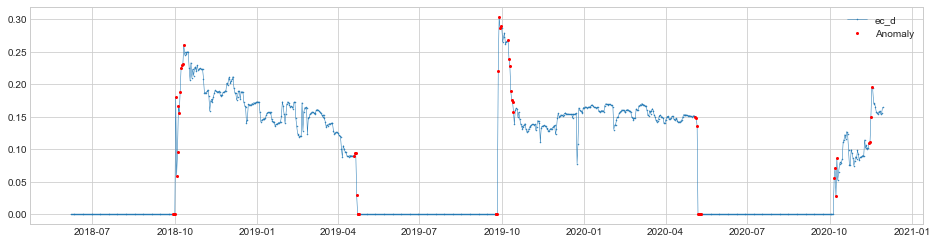

In [15]:
from adtk.detector import LevelShiftAD
steps = [
    ("LevelShiftAD", LevelShiftAD(c=4.0, side='both', window=7))
    
]
pipeline = Pipeline(steps)

s = validate_series(timeseries[0]['ec_d'])
anomalies_ts1 = pipeline.fit_detect(s)
plot(s, anomaly=anomalies_ts1, ts_markersize=1, anomaly_markersize=2,  anomaly_tag="marker",anomaly_color='red');

Функция определения сезонности: 
* для недельной смотрим, является ли 7 лаг частичной корреляции значимым. Как определять, что он является значимым? (Пока по трешхолду). Как определять годовую сезонность? (Пока смотрим, чтобы значений было больше 700)


Определение тренда:
Тренд находится линейный, с помощью линейной регрессии.


statsmodels. seasonal 
вместо сезонности просто использовать значение ряда лагов

In [22]:
#pacf(timeseries[0])
pacf(np.array(timeseries[6].ec_d))[1:7]

array([ 0.98237709, -0.00854712,  0.10555628,  0.07044682,  0.04749356,
       -0.0193068 ])

In [23]:
# определение сезонности
# определение летного потребления
# определение тренда
from statsmodels.tsa.stattools import pacf
from sklearn.linear_model import LinearRegression

def summer_consumption(data):
    # считаем среднее летнее потребление, чтобы отсеить тех, для кого летнее тоже надо предсказывать
    
    counter = data.loc[data.index.month == 7].size + data.loc[data.index.month == 6].size + data.loc[data.index.month == 8].size
    summ = data.loc[data.index.month == 7].sum() + data.loc[data.index.month == 6].sum() + data.loc[data.index.month == 8].sum()
   
    if (counter == 0):
        return 0
    return summ / counter


'''def is_seasonal(data, season = 365, alpha = 90):
    # определяем на сколько процентов уменьшился критерий Дики-Фуллера после удаления сезонности. 
    # Если больше чем на alpha процентов, то сезонность в данных присутствует
    print(pacf(data))
    print(pacf_, confint)
    #print("Критерий Дики-Фуллера: p=%f" % tsa.stattools.adfuller(data)[1])
    kr1 = tsa.stattools.adfuller(data)[1]
    y = data - data.shift(season)
    y = y.dropna()
    #print("Критерий Дики-Фуллера: p=%f" % tsa.stattools.adfuller(y)[1])
    kr2 = tsa.stattools.adfuller(y)[1] 
    tsa.stattools.adfuller(data)[1]
    if (kr2 and kr1 == 0):
        return 0
    if (kr2 == 0):
        return 1
    if (100 * (1-kr2/kr1) > alpha):
        return 1
    return 0
'''

def trend(data):
    regr = LinearRegression()#linear_model.

    # Train the model using the training sets
    regr.fit(np.array(range(data.size)).reshape(-1, 1), data) 
    y_pred = regr.predict(np.array(range(data.size)).reshape(-1, 1))
    plt.scatter(range(data.size), np.array(data).reshape(-1, 1),  color='black')
    plt.plot(range(data.size), y_pred, color='blue', linewidth=3)
    plt.show()
    return regr.coef_[0]

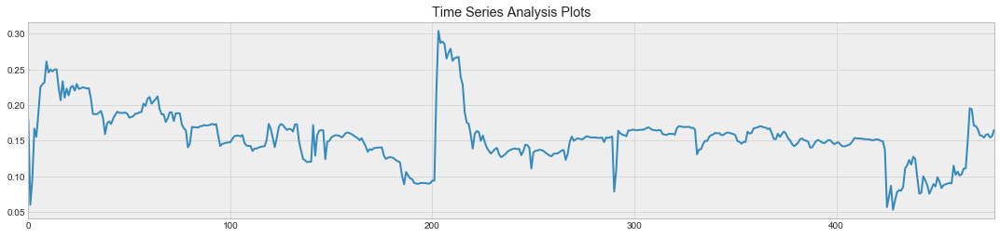

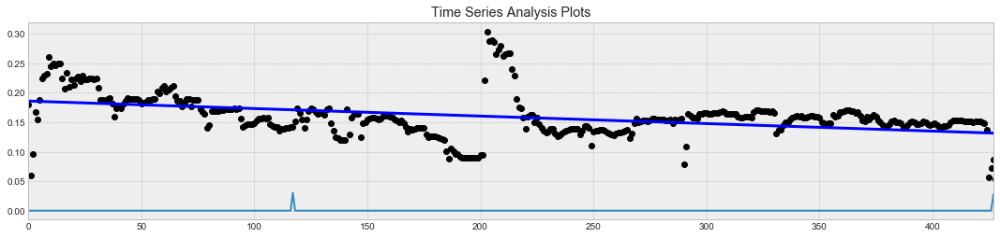

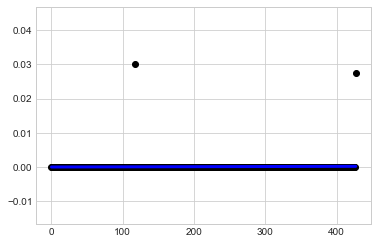

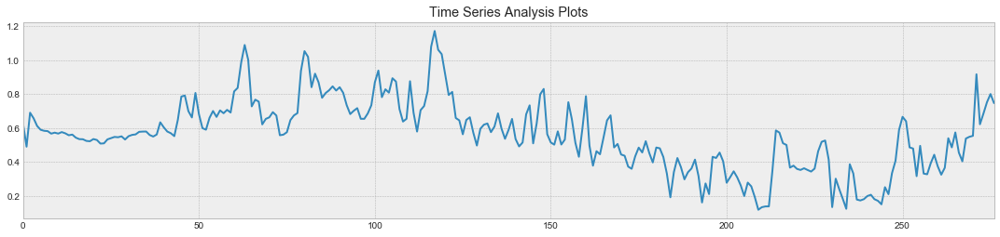

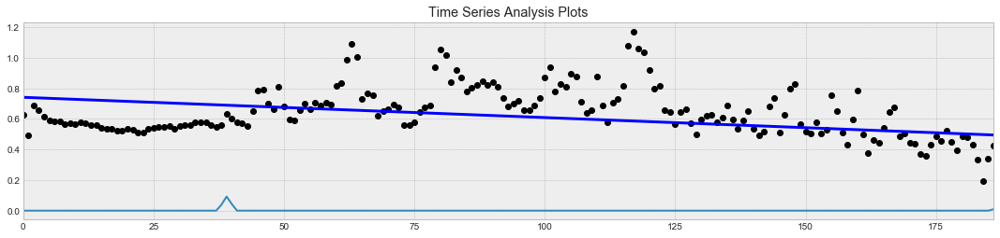

...

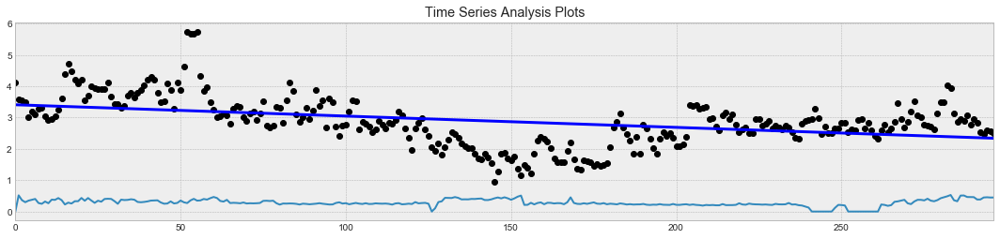

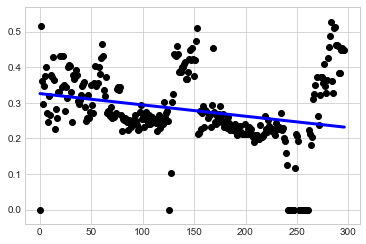

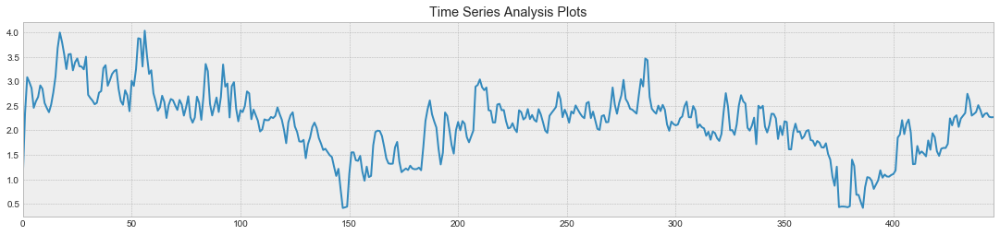

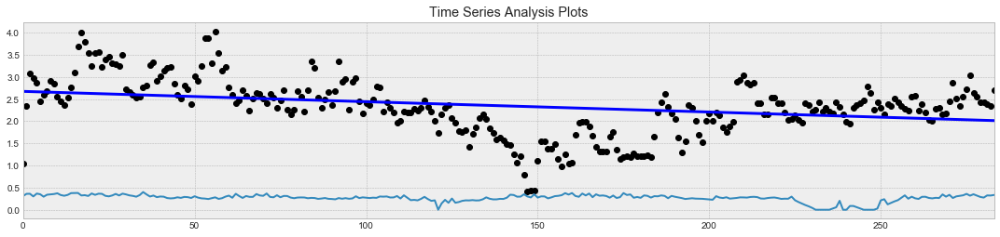

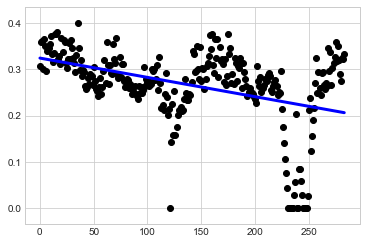

In [72]:

pacf0 = []
#is_7_seasonal0 = []
#is_365_seasonal0 = []
summer0 = []
trend0 = []
trendwinter = []
trendsummer = []
#is_7_seasonal_summer = []
#is_7_seasonal_winter = []
pacf_summer = []
pacf_winter = []
temp_corr = []
cnt = 0
pacf0 = []
for i in range(len(timeseries)):
    
    df = timeseries[i]
    winter_df, summer_df = distributions_division(df.ec_d)
    summer0.append(summer_consumption(df.ec_d))
    #is_365_seasonal0.append( np.int(len(df.ec_d) > 700))
    #is_7_seasonal_summer.append(is_seasonal(summer_df, 7))
    #is_7_seasonal_winter.append(is_seasonal(winter_df, 7))
    trendwinter.append(trend(winter_df))
    trendsummer.append(trend(summer_df))
    temp_corr.append(temperature_corr(df, engine).ec_d.temperature)
    #pacf0.append(pacf(np.array(df.ec_d))[1:7])
    #try:
    #    pacf_summer.append((np.abs(pacf(np.array(summer_df))) > 0.2).astype(int).sum())
    #except:
    #    pacf_summer.append(-1)
    #pacf_winter_zn.append((np.abs(pacf(np.array(winter_df))) > 0.2).astype(int).sum())
    pacf_winter.append(pacf(np.array(winter_df))[1:7])
    try:
        pacf_summer.append(pacf(np.array(summer_df))[1:7])
    except:
        pacf_summer.append(np.array([-1 for i in range(6)]))
    #pacf0.append((np.abs(pacf(np.array(df.ec_d))) > 0.2).astype(int).sum())


In [78]:
classification = pd.DataFrame()

#classification['pacf_summer'] = pacf_summer
#classification['pacf_winter'] = pacf_winter
classification['temp_corr'] = temp_corr
#classification['pacf'] = pacf0
#classification['is_7_seasonal'] = is_7_seasonal0
#classification['is_7_seasonal_winter'] = is_7_seasonal_winter
#classification['is_7_seasonal_summer'] = is_7_seasonal_summer
classification['summer_consumption'] = summer0

#classification['is_365_seasonal'] = is_365_seasonal0
classification['trendwinter'] = trendwinter
classification['trendsummer'] = trendsummer


pacf_winter = np.array(pacf_winter).reshape(17, 6)
pacf_summer = np.array(pacf_summer).reshape(17, 6)

classification['pacf_winter_0'] = pacf_winter[:,0]
classification['pacf_winter_1'] = pacf_winter[:,1]
classification['pacf_winter_2'] = pacf_winter[:,2]
classification['pacf_winter_3'] = pacf_winter[:,3]
classification['pacf_winter_4'] = pacf_winter[:,4]
classification['pacf_winter_5'] = pacf_winter[:,5]

classification['pacf_summer_0'] = pacf_summer[:,0]
classification['pacf_summer_1'] = pacf_summer[:,1]
classification['pacf_summer_2'] = pacf_summer[:,2]
classification['pacf_summer_3'] = pacf_summer[:,3]
classification['pacf_summer_4'] = pacf_summer[:,4]
classification['pacf_summer_5'] = pacf_summer[:,5]

In [156]:
classification

,temp_corr,summer_consumption,trendwinter,trendsummer,pacf_winter_0,pacf_winter_1,pacf_winter_2,pacf_winter_3,pacf_winter_4,pacf_winter_5,pacf_summer_0,pacf_summer_1,pacf_summer_2,pacf_summer_3,pacf_summer_4,pacf_summer_5
0,-0.796830,0.000000,-0.000127,4.572286e-07,0.927694,-0.049237,0.107234,-0.149482,0.036127,-0.034989,-0.002461,-0.002484,-0.002507,-0.002530,-0.002554,-0.002577
1,-0.921637,0.000000,-0.001325,-1.564854e-05,0.891362,-0.005943,0.180670,0.090874,-0.039332,0.018891,0.628676,-0.442826,0.304170,-0.224799,0.145808,-0.109514
2,-0.832912,0.107712,-0.000109,9.796805e-06,0.763926,0.063493,0.102792,0.184286,0.097065,0.045060,0.857478,0.022030,0.050220,0.029475,-0.012932,0.056077
3,-0.921820,0.000000,-0.000268,5.985364e-07,0.885133,0.019280,0.152845,0.020307,0.047931,0.007432,-0.003869,-0.003913,-0.003957,-0.004001,-0.004046,-0.004092
4,-0.785623,0.010505,-0.000640,1.547464e-05,0.888798,0.253942,0.099157,0.119664,0.111769,0.005919,0.516179,0.102018,0.035364,0.157821,0.047475,0.090840
5,-0.785623,0.010505,-0.000640,1.547464e-05,0.888798,0.253942,0.099157,0.119664,0.111769,0.005919,0.516179,0.102018,0.035364,0.157821,0.047475,0.090840
6,-0.762109,0.205722,-0.000271,1.101255e-04,0.773302,0.117964,0.213234,0.022602,-0.044491,0.046125,0.754990,-0.065771,0.207669,0.083367,0.096809,0.052721
7,-0.823700,0.006353,-0.000117,-2.981828e-05,0.733953,0.161307,0.150209,0.125598,0.134663,0.125106,0.622325,0.114446,0.191126,0.116577,0.120244,0.077621
8,-0.765802,0.149515,0.000125,3.574815e-04,0.630043,0.026150,0.182640,0.131486,-0.113468,-0.005972,0.738266,0.143467,0.212676,0.001902,-0.091700,-0.019104
9,-0.812521,0.361697,-0.002120,4.698888e-04,0.935078,0.291020,0.037093,0.157931,0.081388,0.040297,0.793008,0.034970,0.305275,-0.053382,0.017203,-0.114130


Летняя кластеризация

1) Первый кластер будет с временными рядами, у которых среднее потребление < eps. eps = 0.01. Для этого кластера прогноз будет = константа

2) Второй - с наблюдаемой 7-дневной сезонностью

3) Третий - без 7-дневной сезонности

In [157]:
classification.loc[classification.summer_consumption > 0.01]

,temp_corr,summer_consumption,trendwinter,trendsummer,pacf_winter_0,pacf_winter_1,pacf_winter_2,pacf_winter_3,pacf_winter_4,pacf_winter_5,pacf_summer_0,pacf_summer_1,pacf_summer_2,pacf_summer_3,pacf_summer_4,pacf_summer_5
2,-0.832912,0.107712,-0.000109,0.000010,0.763926,0.063493,0.102792,0.184286,0.097065,0.045060,0.857478,0.022030,0.050220,0.029475,-0.012932,0.056077
4,-0.785623,0.010505,-0.000640,0.000015,0.888798,0.253942,0.099157,0.119664,0.111769,0.005919,0.516179,0.102018,0.035364,0.157821,0.047475,0.090840
5,-0.785623,0.010505,-0.000640,0.000015,0.888798,0.253942,0.099157,0.119664,0.111769,0.005919,0.516179,0.102018,0.035364,0.157821,0.047475,0.090840
6,-0.762109,0.205722,-0.000271,0.000110,0.773302,0.117964,0.213234,0.022602,-0.044491,0.046125,0.754990,-0.065771,0.207669,0.083367,0.096809,0.052721
8,-0.765802,0.149515,0.000125,0.000357,0.630043,0.026150,0.182640,0.131486,-0.113468,-0.005972,0.738266,0.143467,0.212676,0.001902,-0.091700,-0.019104
9,-0.812521,0.361697,-0.002120,0.000470,0.935078,0.291020,0.037093,0.157931,0.081388,0.040297,0.793008,0.034970,0.305275,-0.053382,0.017203,-0.114130
13,-0.913279,0.049022,-0.001130,-0.000342,0.923025,-0.081114,0.113421,0.033382,0.083455,0.006878,0.780618,0.041611,0.224408,0.052297,0.049066,0.311855
15,-0.926014,0.230004,-0.003609,-0.000318,0.924589,-0.012066,0.114867,0.047415,0.075121,0.056610,0.822427,0.162470,0.167229,0.031194,0.083559,0.071738
16,-0.937366,0.245520,-0.002332,-0.000417,0.916649,-0.036017,0.175963,0.045349,0.098942,0.041584,0.869550,0.273262,0.204763,-0.023997,0.190228,0.014455


Зимняя кластеризация

Для неотопительного сезона у всех рядов есть недельная сезонность. Здесь важно, есть ли годовая сезонность (возможно ее отсутсвие, если период данных меньше года)

Кластера выделяем с помощью Kmeans


In [171]:
classification = classification.drop('summer_consumption', axis=1)
classification = classification.drop('trendsummer', axis=1)

обосновать

1) нормировка 2 признаков

2) нормировка к среднему значению не влияет на kmeans

3) проверка полезности

4) волатильность

5) клстеризация - для большого колва зданий

In [176]:
classification

,temp_corr,trendwinter,pacf_winter_0,pacf_winter_1,pacf_winter_2,pacf_winter_3,pacf_winter_4,pacf_winter_5,pacf_summer_0,pacf_summer_1,pacf_summer_2,pacf_summer_3,pacf_summer_4,pacf_summer_5
0,-0.796830,-0.000127,0.927694,-0.049237,0.107234,-0.149482,0.036127,-0.034989,-0.002461,-0.002484,-0.002507,-0.002530,-0.002554,-0.002577
1,-0.921637,-0.001325,0.891362,-0.005943,0.180670,0.090874,-0.039332,0.018891,0.628676,-0.442826,0.304170,-0.224799,0.145808,-0.109514
2,-0.832912,-0.000109,0.763926,0.063493,0.102792,0.184286,0.097065,0.045060,0.857478,0.022030,0.050220,0.029475,-0.012932,0.056077
3,-0.921820,-0.000268,0.885133,0.019280,0.152845,0.020307,0.047931,0.007432,-0.003869,-0.003913,-0.003957,-0.004001,-0.004046,-0.004092
4,-0.785623,-0.000640,0.888798,0.253942,0.099157,0.119664,0.111769,0.005919,0.516179,0.102018,0.035364,0.157821,0.047475,0.090840
5,-0.785623,-0.000640,0.888798,0.253942,0.099157,0.119664,0.111769,0.005919,0.516179,0.102018,0.035364,0.157821,0.047475,0.090840
6,-0.762109,-0.000271,0.773302,0.117964,0.213234,0.022602,-0.044491,0.046125,0.754990,-0.065771,0.207669,0.083367,0.096809,0.052721
7,-0.823700,-0.000117,0.733953,0.161307,0.150209,0.125598,0.134663,0.125106,0.622325,0.114446,0.191126,0.116577,0.120244,0.077621
8,-0.765802,0.000125,0.630043,0.026150,0.182640,0.131486,-0.113468,-0.005972,0.738266,0.143467,0.212676,0.001902,-0.091700,-0.019104
9,-0.812521,-0.002120,0.935078,0.291020,0.037093,0.157931,0.081388,0.040297,0.793008,0.034970,0.305275,-0.053382,0.017203,-0.114130


In [178]:
# нормируем столбцы
#classification['pacf_winter'] = (classification['pacf_winter'] - classification['pacf_winter'].mean()) / classification['pacf_winter'].max()
#classification['temp_corr'] = (classification['temp_corr'] - classification['temp_corr'].mean()) / classification['temp_corr'].max()
#classification['trendwinter'] = (classification['trendwinter'] - classification['trendwinter'].mean()) / classification['trendwinter'].max()

In [164]:
#classification.loc[classification.is_365_seasonal == 1][['pacf_winter', 'temp_corr', 'trendwinter']]

In [182]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(classification)
labels = kmeans.labels_
labels

1
2
4
5
6
7
8
9
11
12
13
15
16


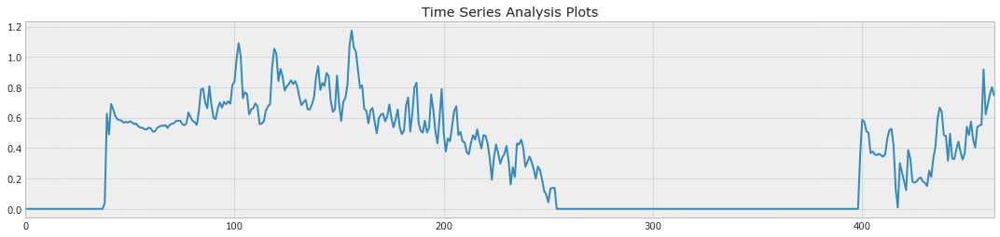

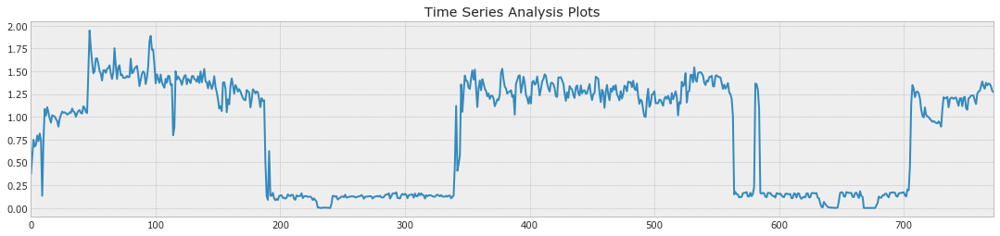

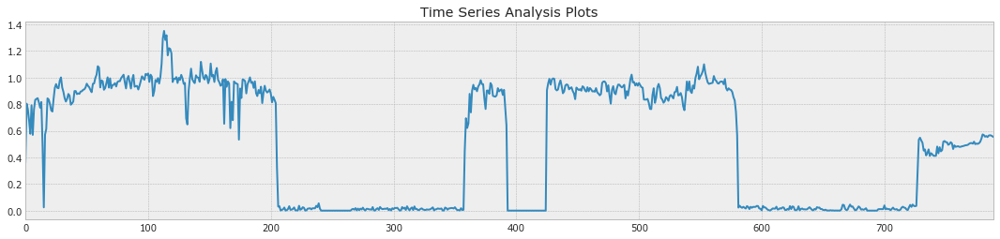

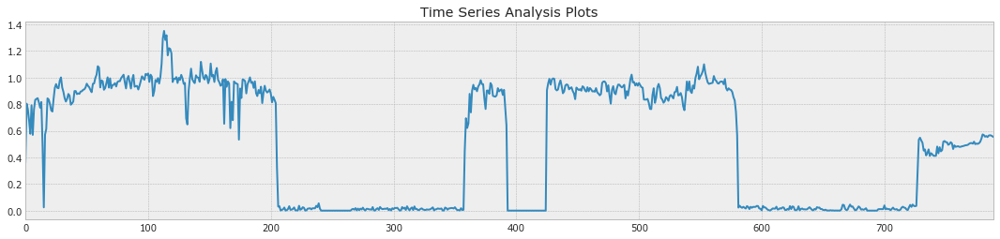

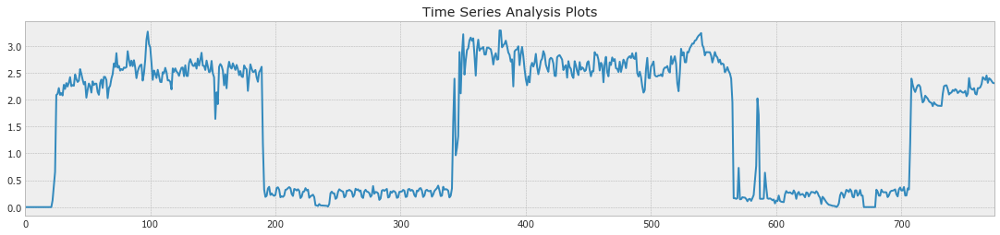

...

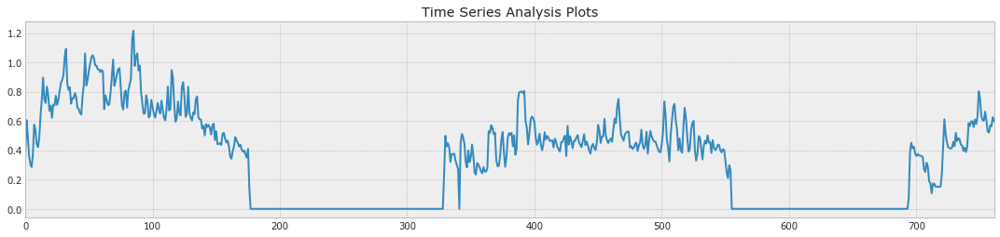

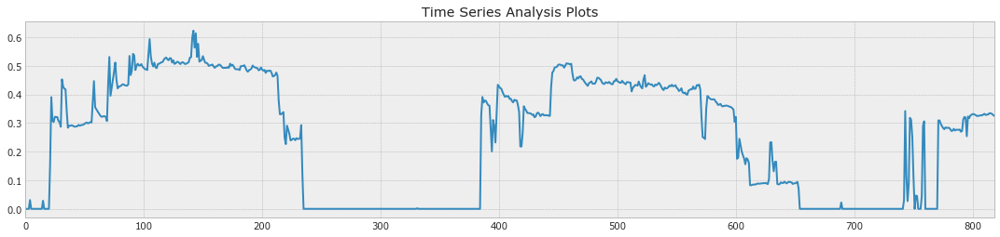

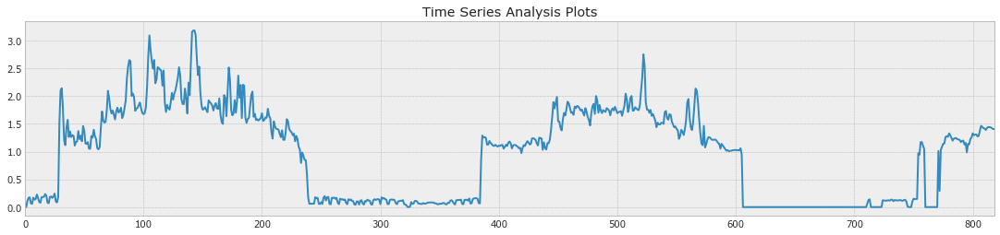

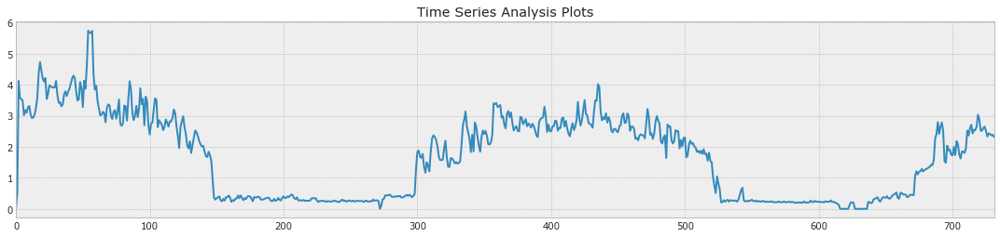

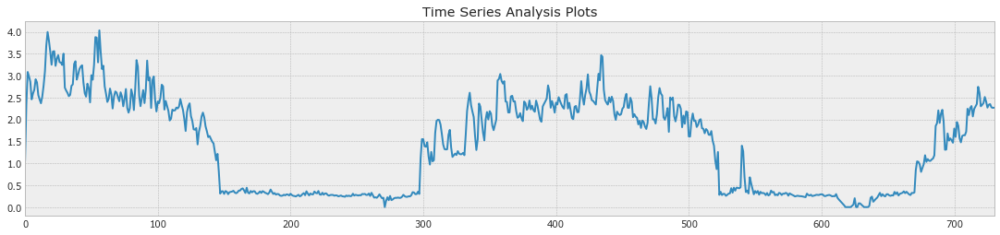

In [187]:
get_claster(0, labels)

10


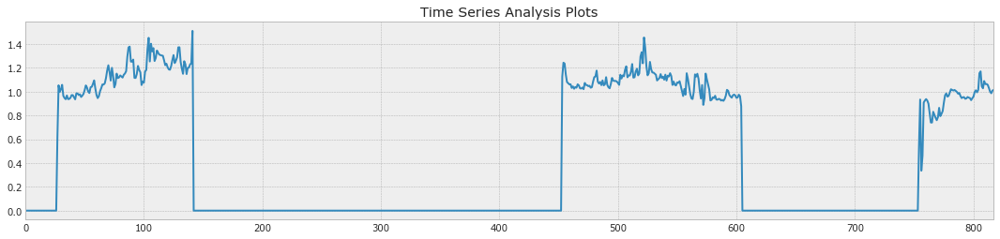

In [188]:
get_claster(1, labels)

0
3
14


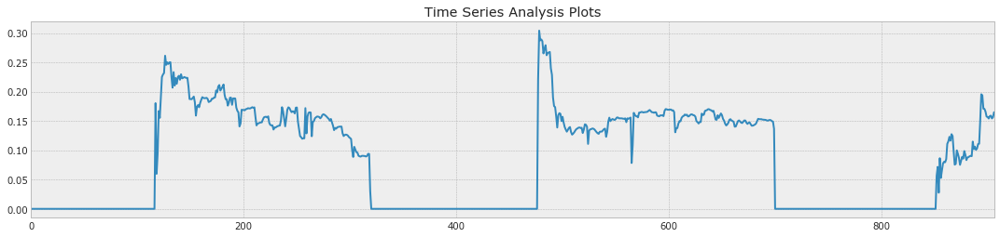

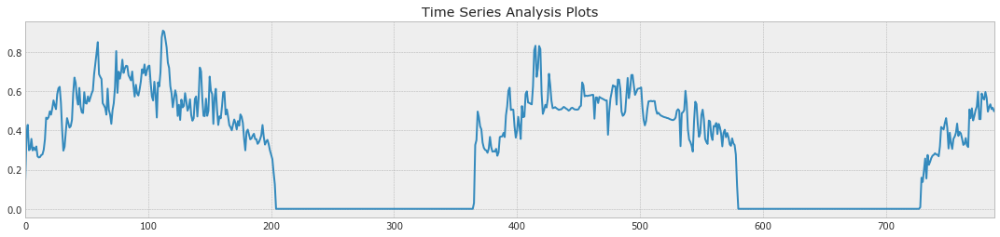

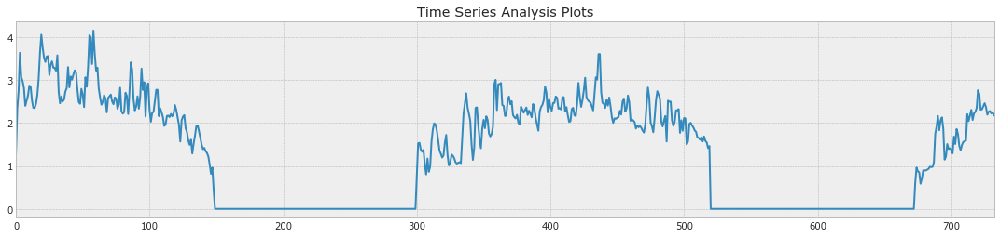

In [189]:
get_claster(2, labels)

### Кластеризация по похожести во времени

функция, строящая ряды из одного кластера

In [186]:
def get_claster(claster, fclust):
    for i in range(len(fclust)):
        if (fclust[i] != claster):
            continue
        else:
            print(i)
            tsplot_only(np.array(timeseries[i].ec_d))

1) L2

В качестве метрики будем использовать L2, но с мягким ограничением сверху для вклада разницы между уровнями отсчётов с одним T.
Так как ряды разные по времени, то берем их максимальное пересечение и делим L2 для этого пересечения на количество тиков.

In [103]:
from scipy.cluster.hierarchy import fclusterdata

In [102]:
def time_series_L2(key1, key2):
    timeSeries1 = timeseries[int(key1[0])]
    timeSeries2 = timeseries[int(key2[0])]
    
    timeSeries2_new = timeSeries2[timeSeries1.index[0] : timeSeries1.index[-1]] 
    timeSeries1_new = timeSeries1[timeSeries2.index[0] : timeSeries2.index[-1]]
    L2 = (timeSeries2_new.ec_d - timeSeries1_new.ec_d) ** 2
    L2_soft = (L2 / (1 + L2)).sum()
    return L2_soft

In [138]:
fclust1 = fclusterdata(np.array([np.array([i]) for i in range(len(timeseries))]), metric=time_series_L2, criterion = 'maxclust', t = 3)


In [139]:
fclust1

array([1, 1, 1, 1, 1, 1, 3, 1, 1, 3, 1, 1, 1, 1, 2, 1, 2, 2], dtype=int32)

In [16]:
get_claster(2, fclust1)

NameError: name 'get_claster' is not defined

2) DTW https://ru.wikipedia.org/wiki/%D0%90%D0%BB%D0%B3%D0%BE%D1%80%D0%B8%D1%82%D0%BC_%D0%B4%D0%B8%D0%BD%D0%B0%D0%BC%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%BE%D0%B9_%D1%82%D1%80%D0%B0%D0%BD%D1%81%D1%84%D0%BE%D1%80%D0%BC%D0%B0%D1%86%D0%B8%D0%B8_%D0%B2%D1%80%D0%B5%D0%BC%D0%B5%D0%BD%D0%BD%D0%BE%D0%B9_%D1%88%D0%BA%D0%B0%D0%BB%D1%8B

In [144]:
#!pip install dtw-python
from dtw import *

In [182]:
def time_series_dft(key1, key2):
    timeSeries1 = timeseries[int(key1[0])]
    timeSeries2 = timeseries[int(key2[0])]
    timeSeries2_new = timeSeries2[timeSeries1.index[0] : timeSeries1.index[-1]] 
    timeSeries1_new = timeSeries1[timeSeries2.index[0] : timeSeries2.index[-1]]
    
    return dtw(np.array(timeSeries1_new.ec_d), np.array(timeSeries2_new.ec_d), keep_internals=True).distance

In [205]:
fclust2 = fclusterdata(np.array([np.array([i]) for i in range(len(timeseries))]), metric=time_series_dft, criterion = 'maxclust', t = 2)


In [206]:
fclust2

array([1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 2], dtype=int32)

0
1
2
3
4
5
7
8
10
11
12
13
15


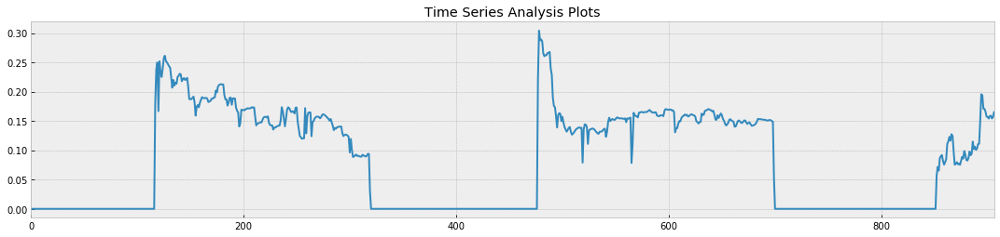

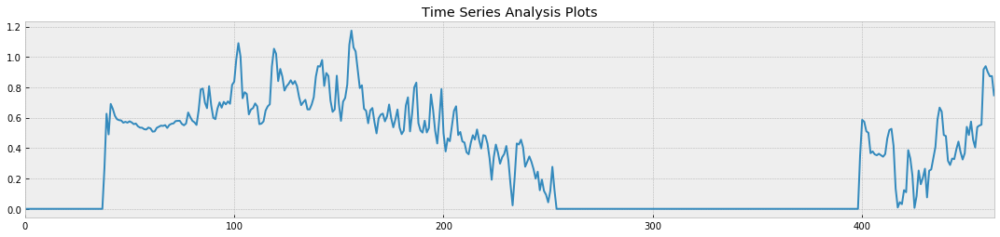

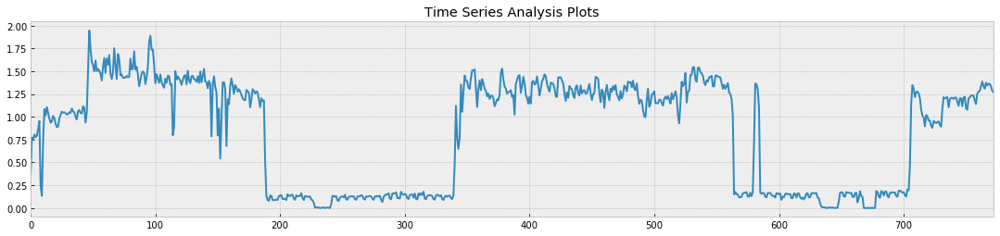

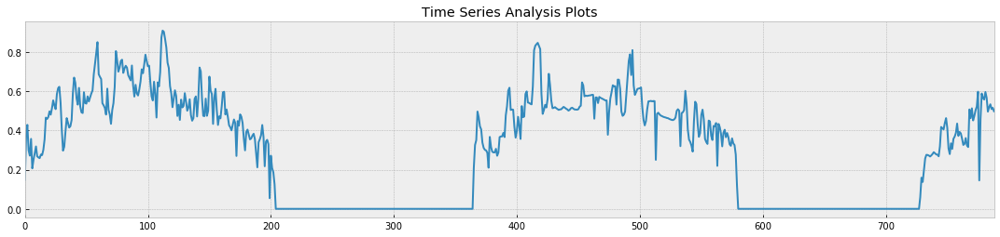

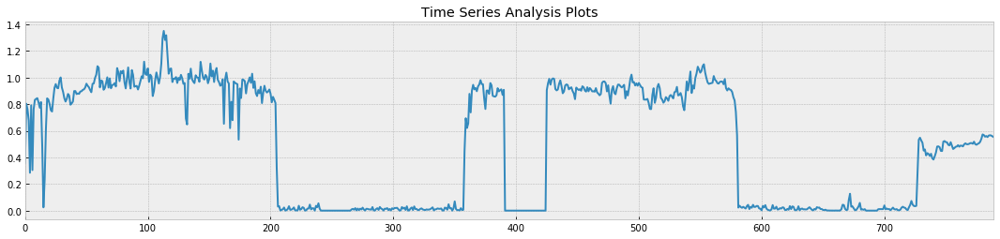

...

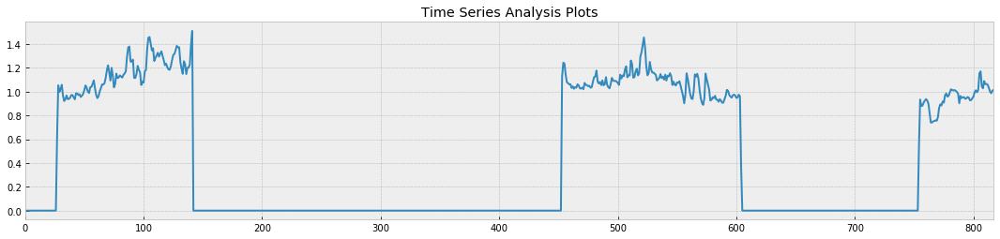

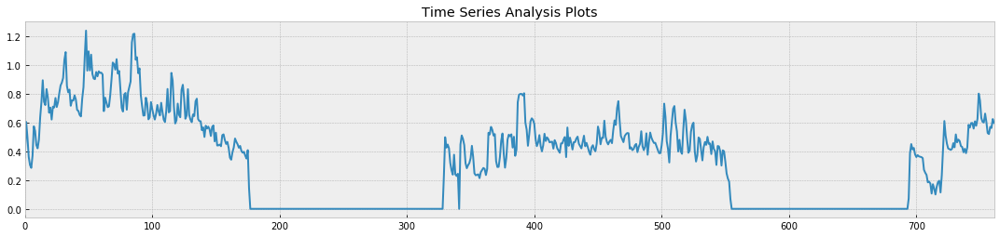

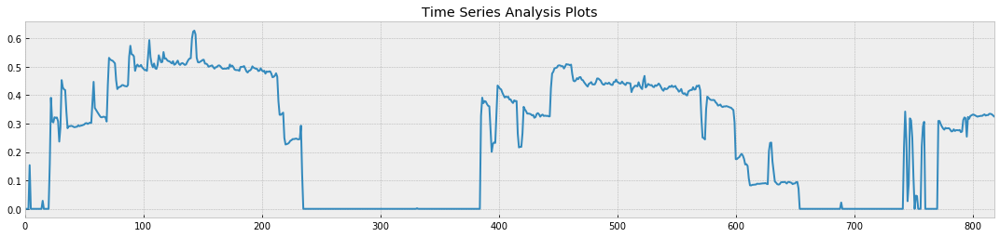

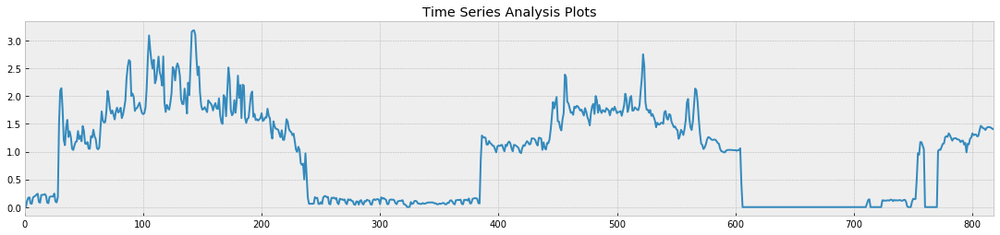

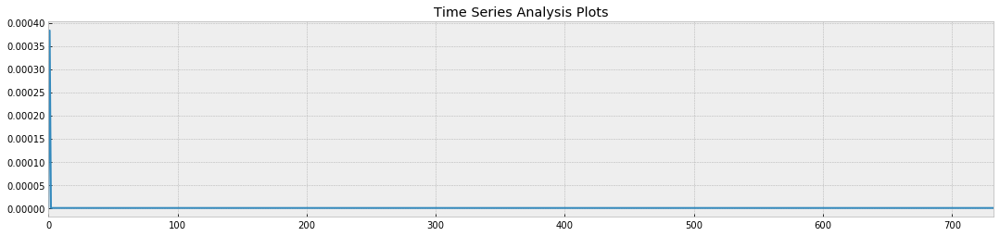

In [199]:
get_claster(1, fclust2)

9
14
16
17


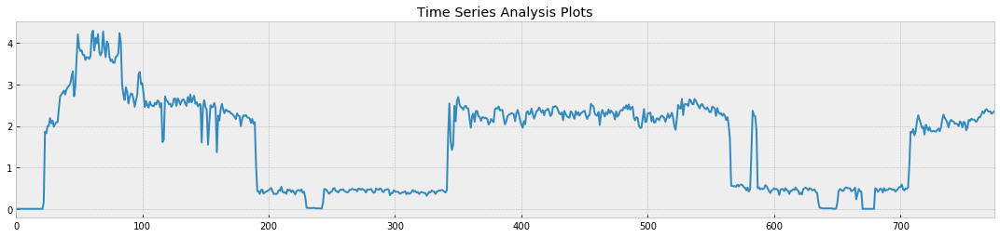

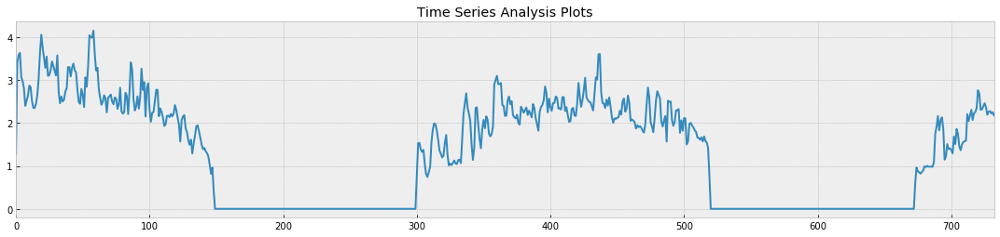

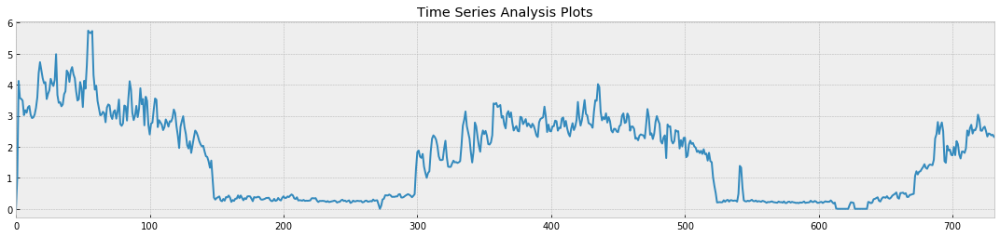

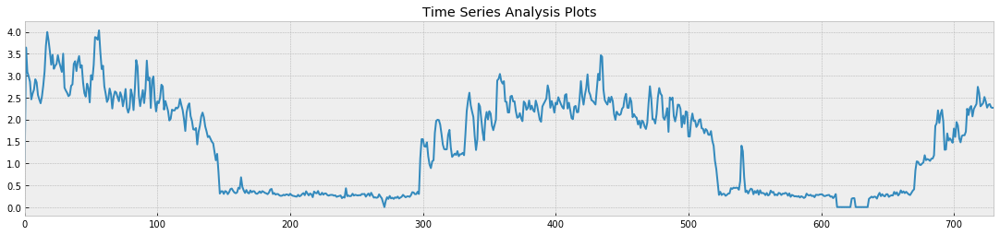

In [187]:
get_claster(2, fclust2)

посмотрим на построенное растояние между графиками одного кластера

Расстояние -  61.772124599999984


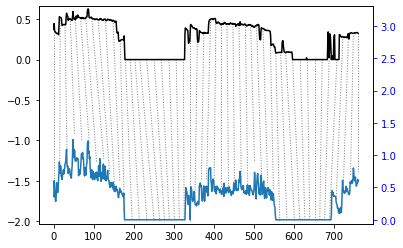

In [209]:
timeSeries1 = timeseries[11]
timeSeries2 = timeseries[12]
timeSeries2_new = timeSeries2[timeSeries1.index[0] : timeSeries1.index[-1]] 
timeSeries1_new = timeSeries1[timeSeries2.index[0] : timeSeries2.index[-1]]
    
disct_3 = dtw(np.array(timeSeries1_new.ec_d), np.array(timeSeries2_new.ec_d), keep_internals=True)
print('Расстояние - ', disct_3.distance)
dtw(timeSeries2_new, timeSeries1_new, keep_internals=True, 
    step_pattern=rabinerJuangStepPattern(6, "c"))\
    .plot(type="twoway",offset=-2)

Расстояние -  137.35638959999986


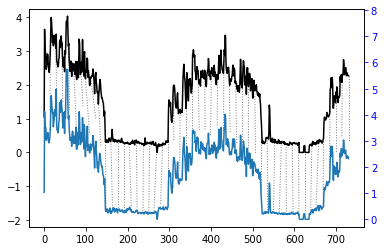

In [191]:
timeSeries1 = timeseries[16]
timeSeries2 = timeseries[17]
timeSeries2_new = timeSeries2[timeSeries1.index[0] : timeSeries1.index[-1]] 
timeSeries1_new = timeSeries1[timeSeries2.index[0] : timeSeries2.index[-1]]
    
disct_3 = dtw(np.array(timeSeries1_new.ec_d), np.array(timeSeries2_new.ec_d), keep_internals=True)
print('Расстояние - ', disct_3.distance)
dtw(timeSeries2_new, timeSeries1_new, keep_internals=True, 
    step_pattern=rabinerJuangStepPattern(6, "c"))\
    .plot(type="twoway",offset=-2)

In [181]:
#disct_3.plot(type="threeway")

посмотрим на построенное растояние между графиками разных кластеров

Расстояние -  755.0721586000003


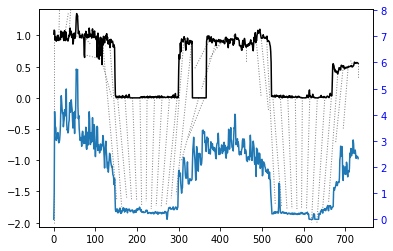

In [196]:
timeSeries1 = timeseries[16]
timeSeries2 = timeseries[4]
timeSeries2_new = timeSeries2[timeSeries1.index[0] : timeSeries1.index[-1]] 
timeSeries1_new = timeSeries1[timeSeries2.index[0] : timeSeries2.index[-1]]
    
disct_3 = dtw(np.array(timeSeries1_new.ec_d), np.array(timeSeries2_new.ec_d), keep_internals=True)
print('Расстояние - ', disct_3.distance)
dtw(timeSeries2_new, timeSeries1_new, keep_internals=True, 
    step_pattern=rabinerJuangStepPattern(6, "c"))\
    .plot(type="twoway",offset=-2)

3) Фреше 

Нам не подходит из-за резкой смены значений временного ряда во время отключения отопления

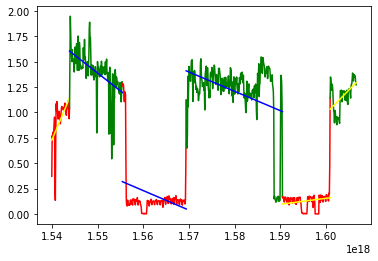

In [175]:
import pandas as pd
import pandas_datareader.data as web
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.dates as mdates

# data
market_data = timeseries[2]

#Calculating EMA and difference
market_data['ema'] = market_data['ec_d'].ewm(200).mean()
market_data['diff_pc'] = (market_data['ec_d'] / market_data['ema']) - 1

#Defining bull/bear signal
TH = 0
market_data['Signal'] = np.where(market_data['diff_pc'] > TH, 1, 0)
market_data['Signal'] = np.where(market_data['diff_pc'] < -TH, -1, market_data['Signal'])


# Plot data and fits

#import seaborn as sns  # This is just to get nicer plots

signal = market_data['Signal']

# How many consecutive signals are needed to change trend
min_signal = 50

# Find segments bounds
bounds = (np.diff(signal) != 0) & (signal[1:] != 0)
bounds = np.concatenate(([signal[0] != 0], bounds))
bounds_idx = np.where(bounds)[0]
# Keep only significant bounds
relevant_bounds_idx = np.array([idx for idx in bounds_idx if np.all(signal[idx] == signal[idx:idx + min_signal])])
# Make sure start and end are included
if relevant_bounds_idx[0] != 0:
    relevant_bounds_idx = np.concatenate(([0], relevant_bounds_idx))
if relevant_bounds_idx[-1] != len(signal) - 1:
    relevant_bounds_idx = np.concatenate((relevant_bounds_idx, [len(signal) - 1]))

# Iterate segments
for start_idx, end_idx in zip(relevant_bounds_idx[:-1], relevant_bounds_idx[1:]):
    # Slice segment
    segment = market_data.iloc[start_idx:end_idx + 1, :]
    x = np.array(mdates.date2num(segment.index.to_pydatetime()))
    # Plot data
    data_color = 'green' if signal[start_idx] > 0 else 'red'
    plt.plot(segment.index, segment['ec_d'], color=data_color)
    # Plot fit
    coef, intercept = np.polyfit(x, segment['ec_d'], 1)
    fit_val = coef * x + intercept
    fit_color = 'yellow' if coef > 0 else 'blue'
    plt.plot(segment.index, fit_val, color=fit_color)